# OpenClassrooms Project 6

## Automatic classification of Consumer Goods

## Objective

Link to assignment: https://openclassrooms.com/fr/paths/164/projects/631/assignment
- Assess the feasibility of creating a classification algorithm based to determine product category based on the image or text description of a product


In [1]:
# Import modules

import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import nltk
import cv2
import seaborn as sns
import numpy as np
import re 
import random

from nltk import FreqDist
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize   

from sklearn import cluster
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import adjusted_mutual_info_score
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE

from PIL import Image
from PIL import ImageFilter
from PIL import ImageOps

from keras.utils import np_utils
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator, array_to_img
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras import layers
from keras import backend as K

Using TensorFlow backend.
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py

In [2]:
# Set up environment
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 300)
plt.rcParams['figure.figsize'] = [14, 6]

## Data Exploration

In [3]:
# Import data
df = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

In [4]:
# Check data structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [5]:
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [6]:
#Check what is inside the product specification column
df['product_specifications'][0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

In [7]:
#Check what is inside the product category tree column
df['product_category_tree'][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [8]:
#Split up the different product categories into separate columns
category_tree = df["product_category_tree"].str.split(">>", expand = True) 

In [9]:
#Replace non-useful characters
for i in category_tree.columns:
    category_tree[i] = category_tree[i].str.replace('[', '')
    category_tree[i] = category_tree[i].str.replace(']', '')
    category_tree[i] = category_tree[i].str.replace('"', '')
    category_tree[i] = category_tree[i].str.replace('"', '')

In [10]:
#Split up the different category levels
for i in category_tree.columns:
    df[f"category_lvl_{i}"] = category_tree[i]

In [11]:
#Check the different categories in our data
df['category_lvl_1'].value_counts()

 Wrist Watches                      149
 Laptop Accessories                  87
 Infant Wear                         84
 Coffee Mugs                         74
 Showpieces                          71
 Bed Linen                           65
 Fragrances                          65
 Network Components                  49
 Cookware                            27
 Table Decor & Handicrafts           27
 Combos and Kits                     24
 Wall Decor & Clocks                 22
 Bath Linen                          21
 Curtains & Accessories              19
 Makeup                              18
 Baby Bedding                        15
 Baby & Kids Gifts                   15
 Body and Skin Care                  15
 Kitchen & Dining Linen              14
 Decorative Lighting & Lamps         14
 Baby Bath & Skin                    14
 Kitchen Tools                       14
 Containers & Bottles                13
 Cushions, Pillows & Covers          13
 Hair Care                            9


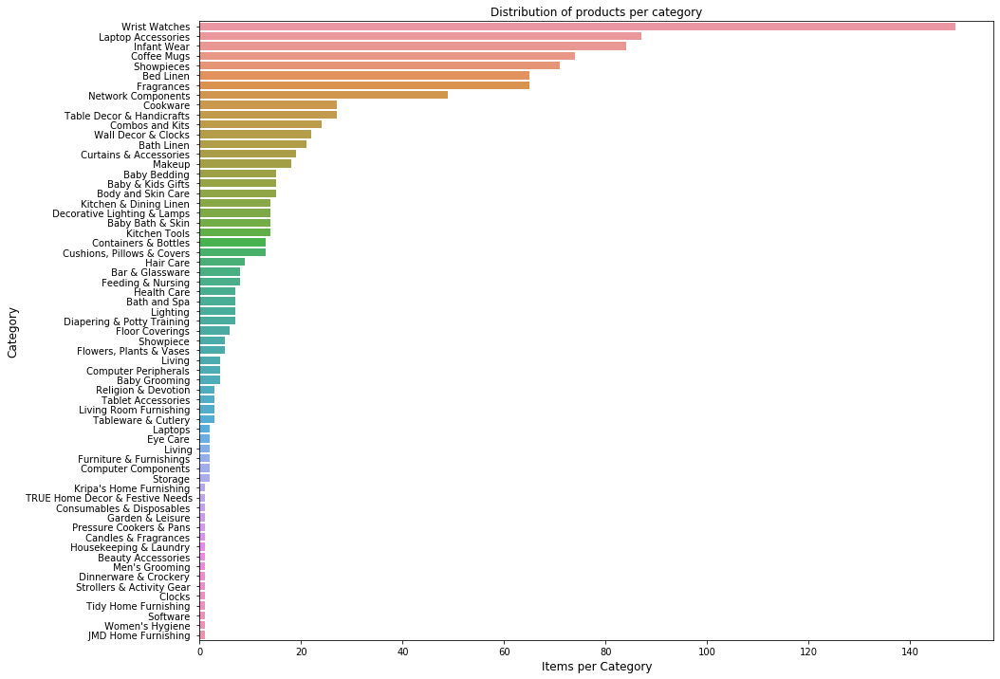

In [12]:
# Plot the frequency of the different categories of products
plt.figure(2, figsize=(15, 12))
plt.title('Distribution of products per category')
sns.countplot(y = df['category_lvl_1'], orient = "h", order = df['category_lvl_1'].value_counts().index)
plt.xlabel('Items per Category', fontsize = 12)
plt.ylabel('Category', fontsize = 12)
plt.yticks(fontsize = 10)
plt.show()

In [13]:
#Drop category tree column as it is no longer useful
df.drop(columns = ['product_category_tree'], inplace = True)

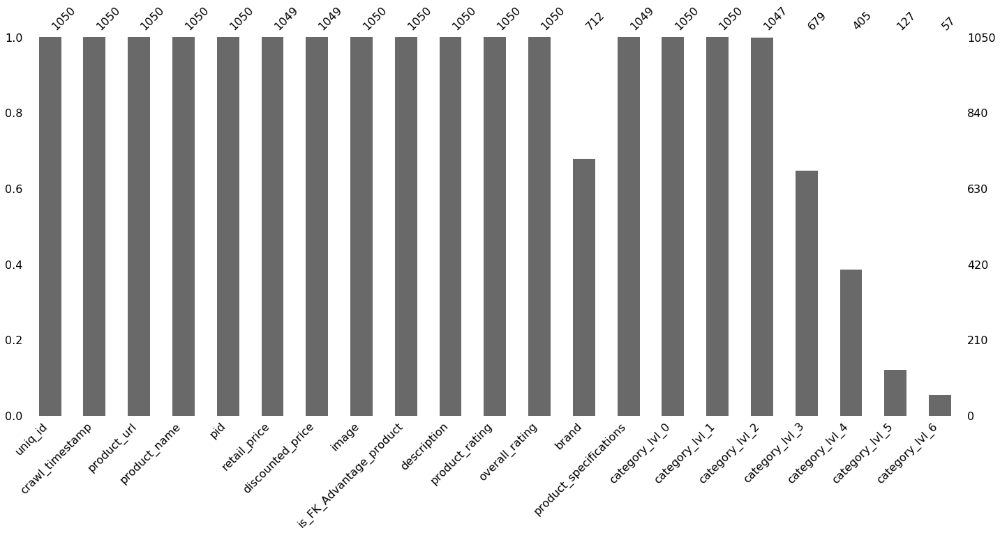

In [14]:
#Check missing data
msno.bar(df)

<b>Conclusion:</b> Category level 1 looks like a good target category to take into consideration as it does not have missing data and provides groups that are specific enough while not being too specific.

In [15]:
# Create integer version of category level 1 label for use with CNN
df['category_lvl_1_int'] = pd.factorize(df['category_lvl_1'])[0]

In [16]:
# Do one hot encoding of category integer labels for later use with CNN
ohe_categories = np_utils.to_categorical(df['category_lvl_1_int'])
ohe_categories = pd.DataFrame(ohe_categories)

In [17]:
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category_lvl_0,category_lvl_1,category_lvl_2,category_lvl_3,category_lvl_4,category_lvl_5,category_lvl_6,category_lvl_1_int
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet...,None,None,None,0
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red...",None,None,1
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE...,None,None,1
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King siz...,None,None,2
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double ...,None,None,2


In [18]:
# Check the one-hot encoded labels
ohe_categories.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
#Join the original df with the one-hot encoded categories
df = pd.merge(df,ohe_categories, left_index=True, right_index=True)

In [20]:
#Create train and test datasets

train_df, test_df = train_test_split(df, train_size=0.8, random_state = 42)

## Treatment of Text

In [21]:
#Get example description
example = df['description'][5]
print(example)

Maserati Time R8851116001 Analog Watch  - For Boys - Buy Maserati Time R8851116001 Analog Watch  - For Boys  R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!


#### Lower Case

In [22]:
#Create function to convert text to lower case
def lower_case(text):
    text = text.lower()
    return text

In [23]:
#Apply lower case function
example = lower_case(example)
print(example)

maserati time r8851116001 analog watch  - for boys - buy maserati time r8851116001 analog watch  - for boys  r8851116001 online at rs.24400 in india only at flipkart.com. - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!


In [24]:
#Apply lower case to entire description column
train_df['description'] = train_df['description'].apply(lower_case)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


#### Remove Digits

In [25]:
#Create function to remove entire digits from descriptions. 
#Keeps them if they are linked to a letter of some kind as this could indicate a model number
def remove_digits(text): 
    pattern = r'\b[0-9]+\b'
    text = re.sub(pattern, '', text)
    return text

In [26]:
#Replacing all digits for example
example = remove_digits(example)
print(example)

maserati time r8851116001 analog watch  - for boys - buy maserati time r8851116001 analog watch  - for boys  r8851116001 online at rs. in india only at flipkart.com. - great discounts, only genuine products,  day replacement guarantee, free shipping. cash on delivery!


In [27]:
#Replacing in all rows
train_df['description'] = train_df['description'].apply(remove_digits)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


#### Tokenization

In [28]:
#Define tokenizer so that words will be separated and punctuation removed.
def token(text):
    tokenizer = nltk.RegexpTokenizer(r'\w+')
    text = tokenizer.tokenize(text)
    return text

In [29]:
#Tokenize example
example_words = token(example)
print(example_words)

['maserati', 'time', 'r8851116001', 'analog', 'watch', 'for', 'boys', 'buy', 'maserati', 'time', 'r8851116001', 'analog', 'watch', 'for', 'boys', 'r8851116001', 'online', 'at', 'rs', 'in', 'india', 'only', 'at', 'flipkart', 'com', 'great', 'discounts', 'only', 'genuine', 'products', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'on', 'delivery']


#### Remove Stopwords

In [30]:
def remove_stopwords(text):
    full_stopwords = stopwords.words('english')
    text = [word for word in text if word not in full_stopwords]
    return text

In [31]:
example_words = remove_stopwords(example_words)
print(example_words)

['maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'buy', 'maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'r8851116001', 'online', 'rs', 'india', 'flipkart', 'com', 'great', 'discounts', 'genuine', 'products', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'delivery']


In [32]:
# Corpus stopwords
# Inspired by solution here: https://stackoverflow.com/questions/56282082/type-error-in-nltk-freqdist-using-pandas-dataframe
full_stopwords = stopwords.words('english')
tokenizer = nltk.RegexpTokenizer(r'\w+')

# Generate list of most frequent words based on column in data frame
word_freq = FreqDist(sum(train_df['description'].map(tokenizer.tokenize), []))

#Get freq dist not including English stopwords
filtered_word_freq = dict((word, freq) for word, freq in word_freq.items() if word not in full_stopwords)

#Order freq dist according to value size
{k: v for k, v in sorted(filtered_word_freq.items(), key=lambda item: item[1], reverse = True)}

#Get top words (those that come up more than 100 times) in list
# We will then use this as a base for filtering
corpus_stopwords = []
for k in filtered_word_freq:
    if filtered_word_freq[k] >= 100:
        corpus_stopwords.append(k)

In [33]:
# View corpus stopwords
corpus_stopwords

['analog',
 'watch',
 'men',
 'buy',
 'online',
 'rs',
 'india',
 'flipkart',
 'com',
 'great',
 'discounts',
 'genuine',
 'products',
 'day',
 'replacement',
 'guarantee',
 'free',
 'shipping',
 'cash',
 'delivery',
 'ceramic',
 'price',
 'made',
 'quality',
 'material',
 'specifications',
 'general',
 'brand',
 'model',
 'number',
 'type',
 'pack',
 'color',
 'box',
 'laptop',
 'battery',
 'key',
 'features',
 'l',
 'adapter',
 'power',
 'product',
 'size',
 'x',
 'also',
 'sales',
 'package',
 'warranty',
 'cm',
 'design',
 'fabric',
 'printed',
 'dimensions',
 'wash',
 'care',
 'water',
 'contents',
 'set',
 'combo',
 'details',
 'ideal',
 'women',
 'gift',
 'baby',
 'girl',
 'cotton',
 'inch',
 'showpiece',
 'best',
 'prices',
 'home',
 'multicolor',
 'perfect',
 'blue',
 'mug',
 'coffee',
 'skin',
 'usb',
 'mugs']

In [34]:
#Out of corpus stopwords, keeping the following
to_keep= ['analog',
             'watch',
             'men',
             'online',
             'ceramic',
             'laptop',
             'battery',
             'key',
             'adapter',
             'power',
             'cm',
             'design',
             'fabric',
             'printed',
             'wash',
             'care',
             'water',
             'set',
             'combo',
             'women',
             'gift',
             'baby',
             'girl',
             'cotton',
             'inch',
             'showpiece',
             'home',
             'multicolor',
             'blue',
             'ml',
             'mug',
             'coffee',
             'skin',
             'usb',
             'mugs']

In [35]:
corpus_stopwords = [ele for ele in corpus_stopwords if ele not in to_keep] 

In [36]:
#Add corpus stopwords to the list of stopwords
full_stopwords = stopwords.words('english')
full_stopwords.extend(corpus_stopwords)

#### Single Characters

In [37]:
#We also want to remove single characters
single_chars = []
for i in filtered_word_freq.keys():
    if len(i) == 1:
        if i not in single_chars:
            single_chars.append(i)

In [38]:
single_chars

['l',
 'x',
 'v',
 'w',
 'b',
 'h',
 'g',
 'c',
 'e',
 'f',
 'n',
 'r',
 'k',
 'p',
 'u',
 'q']

In [39]:
#Add single characters to our list of stopwords
full_stopwords.extend(single_chars)

In [40]:
#Remove single characters from example
example_words = [word for word in example_words if word not in full_stopwords]
print(example_words)

['maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'r8851116001', 'online']


In [41]:
# Function to remove all stopwords created in previous steps
def remove_all_stopwords(text):
    text = [word for word in text if word not in full_stopwords]
    return text

In [42]:
# Remove stopwords from example
example_words = remove_all_stopwords(example_words)
print(example_words)

['maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'maserati', 'time', 'r8851116001', 'analog', 'watch', 'boys', 'r8851116001', 'online']


#### Lemmatization

In [43]:
# Create function to lemmatize
def lemmatize(text):
    wordnet_lemmatizer = WordNetLemmatizer()
    text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return text

In [44]:
#Apply to example
example_words = lemmatize(example_words)
print(example_words)

['maserati', 'time', 'r8851116001', 'analog', 'watch', 'boy', 'maserati', 'time', 'r8851116001', 'analog', 'watch', 'boy', 'r8851116001', 'online']


### Vectorizers

In [45]:
#Creating a tokenizer that also acts as a lemmatizer
#Inspired from: https://scikit-learn.org/stable/modules/feature_extraction.html

class LemmaTokenizer:
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, doc):
        return [self.wnl.lemmatize(t) for t in tokenizer.tokenize(doc)]

#### Count Vectorizer

In [46]:
# Load the library with the CountVectorizer method

# Initialise the count vectorizer with full stop words list
count_vectorizer = CountVectorizer(lowercase = True,
                                   tokenizer = LemmaTokenizer(),
                                   stop_words = full_stopwords,
                                   max_df = 0.99,
                                   min_df = 0.01,
                                   ngram_range=(1,2)
                                  )

# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(train_df['description'])

/opt/anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['content', 'detail', 'dimension', 'discount', 'doe', 'feature', 'ha', 'sale', 'specification', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


#### TF/IDF Vectorizer

In [47]:
#https://towardsdatascience.com/natural-language-processing-feature-engineering-using-tf-idf-e8b9d00e7e76

tf_vectorizer = TfidfVectorizer(lowercase = True,
                                tokenizer = LemmaTokenizer(),
                                stop_words = full_stopwords,
                                max_df = 0.99,
                                min_df = 0.01,
                                ngram_range=(1,2)
                               )

#Create TF/IDF Vectors
tf_data = tf_vectorizer.fit_transform(train_df['description'])

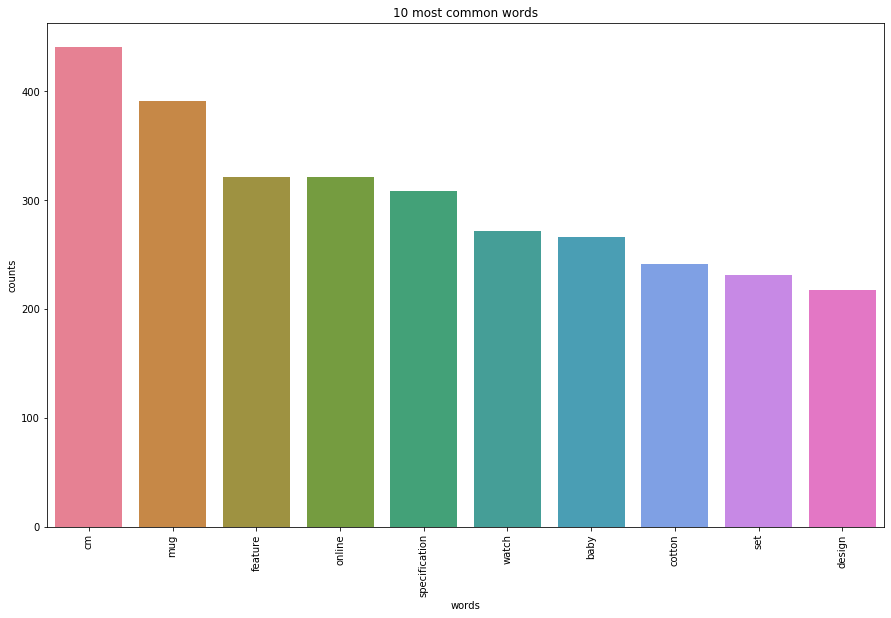

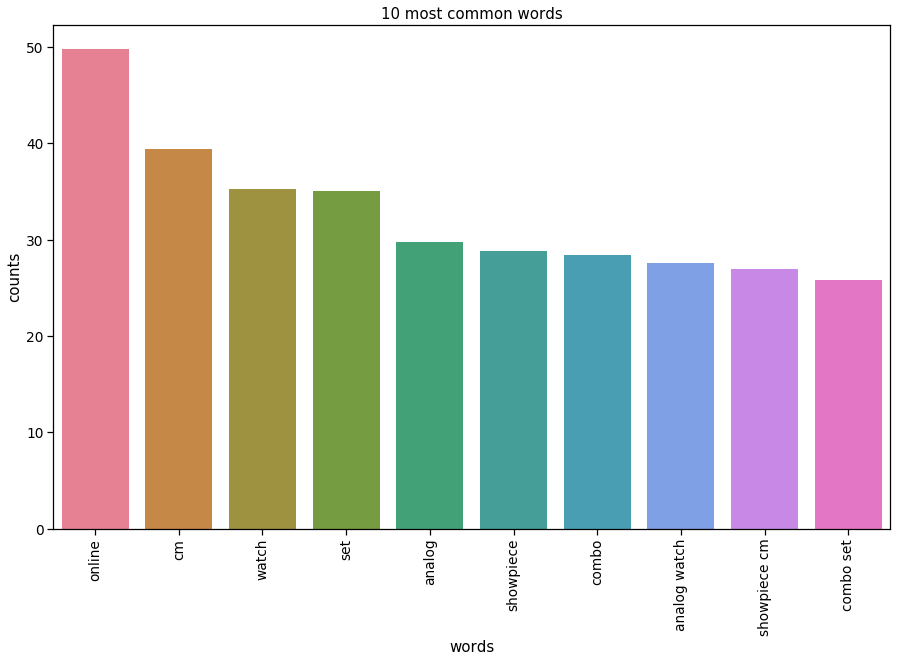

In [48]:
# Create function to view top 10 words based on a vectorizer

def plot_10_most_common_words(count_data, count_vectorizer):
    words = count_vectorizer.get_feature_names()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts+=t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:10]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words)) 
    
    plt.figure(2, figsize=(15, 15/1.6180))
    plt.subplot(title='10 most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x_pos, counts, palette='husl')
    plt.xticks(x_pos, words, rotation=90) 
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.show()
    
# Visualise the 10 most common words
plot_10_most_common_words(count_data, count_vectorizer)
plot_10_most_common_words(tf_data, tf_vectorizer)

### LDA

In [49]:
# Helper function
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        print(f"\nTopic #{topic_idx}")
        print(" ".join([words[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
        
# Tweak the two parameters below
number_topics = 10
number_words = 10

# Create and fit the LDA model for count vectorizer
lda_count = LDA(n_components=number_topics, n_jobs=-1, random_state = 42)
lda_count.fit(count_data)

# Create and fit the LDA model for TF/IDF vectorizer
lda_tf = LDA(n_components=number_topics, n_jobs=-1, random_state = 42)
lda_tf.fit(tf_data)


# Print the topics found by the LDA model
print("Topics found via LDA with Count Vectorizer:")
print_topics(lda_count, count_vectorizer, number_words)
print('\n')
print("Topics found via LDA with TF/IDF Vectorizer:")
print_topics(lda_tf, tf_vectorizer, number_words)

Topics found via LDA with Count Vectorizer:

Topic #0
mug coffee coffee mug ceramic tea gift one get bring mug bring

Topic #1
baby fabric detail cotton boy baby boy printed content specification sale

Topic #2
showpiece showpiece cm cm ceramic mug rockmantra design safe creation cm online

Topic #3
cm showpiece towel home wall set showpiece cm feature brass glass

Topic #4
watch analog analog watch men online discount watch men woman dial strap

Topic #5
usb blanket online ceramic ceramic mug lip mug cream eye face

Topic #6
girl baby baby girl dress detail cotton fabric length specification occasion

Topic #7
cm dimension feature height specification inch width sale key design

Topic #8
light usb cover cotton single cm sheet hair led inch

Topic #9
laptop adapter combo set skin combo set battery power online set online


Topics found via LDA with TF/IDF Vectorizer:

Topic #0
usb coffee mug tea coffee mug home usb usb port original stylish

Topic #1
baby girl baby girl detail fabric c

<b>Conclusion</b>: We already see a certain level of coherence among certain topics (for example topic 4 with the TF/IDF vectorizer)

In [50]:
# Create dictionaries to keep values for the best topic per item
val_best_topic = {}

# Create dictionary to keep the number of the best topic per item
best_topic = {}

# Attach the best LDA topic to each item
matrix = lda_tf.transform(tf_vectorizer.transform(train_df['description']))
for i in range(0,matrix.shape[0]):
    val_best_topic[i] = 0
    for j in range(0, matrix.shape[1]):
        if matrix[i,j] > val_best_topic[i]:
            val_best_topic[i] = matrix[i,j]
            best_topic[i]= j

In [51]:
# Create a new column with the best LDA topic
train_lda = train_df.copy()
train_lda['topic_lda'] = list(best_topic.values())

In [52]:
# Show all categories contained in each LDA topic and the number of items in each category
train_lda.pivot_table(values ='category_lvl_0', index = ['topic_lda', 'category_lvl_1'], aggfunc = 'count')

category_lvl_0
topic_lda category_lvl_1                                  
0          Baby & Kids Gifts                             1
           Baby Grooming                                 1
           Bar & Glassware                               1
           Bed Linen                                     3
           Coffee Mugs                                  11
           Containers & Bottles                          2
           Diapering & Potty Training                    1
           Laptop Accessories                            9
           Network Components                           18
1          Baby & Kids Gifts                             8
           Baby Bedding                                  1
           Bed Linen                                     4
           Containers & Bottles                          5
           Cushions, Pillows & Covers                   10
           Diapering & Potty Training                    2
           Feeding & Nursing                             2
           Infant Wear                                  69
           Laptop Accessories                            1
           Living                                        1
           Wall Decor & Clocks                           1
2          Coffee Mugs                                  19
           Decorative Lighting & Lamps                   5
           Infant Wear                                   1
           Kitchen & Dining Linen                        4
           Laptop Accessories                            1
           Showpiece                                     1
           Showpieces                                   40
           Table Decor & Handicrafts                    14
3          Cookware                                     18
           Furniture & Furnishings                       1
           Laptops                                       2
           Makeup                                        1
           Network Components                            3
           Religion & Devotion                           1
           Showpieces                                    1
4          Coffee Mugs                                  10
           Laptop Accessories                            7
           Makeup                                        1
           Wrist Watches                               107
5          Baby & Kids Gifts                             1
           Baby Bath & Skin                              3
           Baby Bedding                                  2
           Baby Grooming                                 1
           Bar & Glassware                               5
           Bath and Spa                                  5
           Beauty Accessories                            1
           Bed Linen                                     3
           Body and Skin Care                            3
           Clocks                                        1
           Coffee Mugs                                  23
           Combos and Kits                              12
           Computer Components                           2
           Containers & Bottles                          3
           Cookware                                      2
           Decorative Lighting & Lamps                   1
           Diapering & Potty Training                    1
           Dinnerware & Crockery                         1
           Fragrances                                    1
           Garden & Leisure                              1
           Hair Care                                     6
           Health Care                                   5
           Kitchen Tools                                 5
           Laptop Accessories                           28
           Lighting                                      1
           Makeup                                        4
           Network Components                            1
           Showpieces           

In [53]:
##### Keeping this commented out as it makes buttons disappear
##### Problem logged and in progress: https://github.com/bmabey/pyLDAvis/issues/162

#import pyLDAvis.sklearn
#pyLDAvis.enable_notebook()
#pyLDAvis.sklearn.prepare(lda_count, count_data, count_vectorizer)

In [54]:
##### Keeping this commented out as it makes buttons disappear
##### Problem logged and in progress: https://github.com/bmabey/pyLDAvis/issues/162

#import pyLDAvis.sklearn
#pyLDAvis.enable_notebook()
#pyLDAvis.sklearn.prepare(lda_tf, tf_data, tf_vectorizer)

<b>Example of what running the above code shows</b>
<img src="LDAvis_01.png" style="width: 1000px;"/>

<img src="LDAvis_02.png" style="width: 1000px;"/>

<img src="LDAvis_03.png" style="width: 1000px;"/>

<img src="LDAvis_04.png" style="width: 1000px;"/>

### Create Training Dataset

#### TF/IDF

We will now make a dataset consisting of the features generated by the TF/IDF algorithm

In [55]:
#Convert TF/IDF results into a dataframe
feature_names = tf_vectorizer.get_feature_names()
dense = tf_data.todense()
denselist = dense.tolist()
df_w_features = pd.DataFrame(denselist, columns=feature_names)

In [56]:
#Reset index of training dataset to match that of the new features
train_df.reset_index(inplace = True, drop = True)

#Merge the two datasets to have all features in the same place
final_tf_df = pd.merge(train_df, df_w_features, left_index= True, right_index = True)

In [57]:
feature_names

['5v',
 'abstract',
 'abstract double',
 'abstract single',
 'ac',
 'accessory',
 'actual',
 'actual label',
 'adapter',
 'adapter designed',
 'adapter power',
 'add',
 'add kitchen',
 'additional',
 'additional detail',
 'additional feature',
 'adorable',
 'adorable fantastic',
 'affordable',
 'affordable mug',
 'age',
 'age group',
 'analog',
 'analog watch',
 'apply',
 'area',
 'aroma',
 'around',
 'around enjoyment',
 'art',
 'assured',
 'assured durability',
 'attractive',
 'attractive graphic',
 'audio',
 'audio video',
 'authentication',
 'authentication certification',
 'available',
 'baby',
 'baby boy',
 'baby girl',
 'back',
 'back case',
 'bag',
 'base',
 'bath',
 'bath towel',
 'battery',
 'beautiful',
 'beautifully',
 'beautifully designed',
 'bed',
 'bedroom',
 'black',
 'black strap',
 'blanket',
 'bleach',
 'blue',
 'body',
 'body design',
 'body feature',
 'bottle',
 'boy',
 'boy baby',
 'boy girl',
 'brass',
 'brass case',
 'break',
 'break mug',
 'bring',
 'bring lau

In [58]:
final_tf_df.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image_x,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category_lvl_0,category_lvl_1,category_lvl_2,category_lvl_3,category_lvl_4,category_lvl_5,category_lvl_6,category_lvl_1_int,0,1,2,...,weight,weight height,weight kg,well,well know,white,wide,wide selection,width,width cm,width inch,wild,wireless,without,woman,wood,wooden,work,would,year,year come,yellow,yes,yet,yet fresh
0,b144a363c107c7bdd91f32d6e28ba6f2,2016-01-07 05:50:25 +0000,http://www.flipkart.com/timewel-1100-n1192-ana...,Timewel 1100-N1192 Analog Watch - For Men,WATEYAP38HHARJDT,995.0,995.0,b144a363c107c7bdd91f32d6e28ba6f2.jpg,False,timewel -n1192 analog watch - for men - buy t...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Mechanism""...",Watches,Wrist Watches,Timewel Wrist Watches,None,None,None,None,3,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,29def171d7e31d48571a52f0fb3e6b07,2016-03-02 19:09:22 +0000,http://www.flipkart.com/ech-oly-ceramic-inside...,Ech oly Ceramic Inside Fitting Hookah Mouth Tip,HMTEFW3SGGF9HYPT,1799.0,699.0,29def171d7e31d48571a52f0fb3e6b07.jpg,False,ech oly ceramic inside fitting hookah mouth ti...,No rating available,No rating available,Ech oly,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Table Decor & Handicrafts,Table Decor,Hookah Mouth Tips,Ech oly Hookah Mouth Tips,Ech oly Ceramic Inside Fitting Hookah Mouth T...,None,26,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,9f9bb0ef3bb8af571bcfbfa1a22150bd,2016-01-07 05:50:25 +0000,http://www.flipkart.com/lapguard-hp-pavilion-d...,Lapguard HP Pavilion DV7-6000 Series 6 Cell La...,ACCDSY8ESXF9AUHY,3999.0,1699.0,9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg,False,buy lapguard hp pavilion dv7- series cell lap...,No rating available,No rating available,Lapguard,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,Batteries,Lapguard Batteries,None,None,None,17,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,7f2f1f3039d1f5bc23226fc36577eab9,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-re...,"Smartpro 19.5v,3.9a Replacement Charger for Va...",ACCEGZ6BUESXR4VH,1499.0,539.0,7f2f1f3039d1f5bc23226fc36577eab9.jpg,False,"key features of smartpro .5v,.9a replacement c...",No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,Adapters,Smartpro Adapters,"Smartpro 19.5v,3.9a Replacement Charger for V...",None,None,17,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,73901494efea71869576898c68b5eee4,2016-03-05 16:23:23 +0000,http://www.flipkart.com/ville-style-polyester-...,Ville Style Polyester Maroon Floral Eyelet Doo...,CRNEGGZFH8XWXYEA,999.0,399.0,73901494efea71869576898c68b5eee4.jpg,False,key features of ville style polyester maroon f...,No rating available,No rating available,Ville Style,"{""product_specification""=>[{""key""=>""Reversible...",Home Furnishing,Curtains & Accessories,Curtains,Ville Style Polyester Maroon Floral Eyelet Do...,None,None,None,0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.092693,0.054538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [59]:
final_tf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Columns: 862 entries, uniq_id to yet fresh
dtypes: bool(1), float32(63), float64(779), int64(1), object(18)
memory usage: 5.3+ MB


#### Count Vectorizer

We can also create datasets for the count vectorizer, which might work better with certain models

In [60]:
#Convert count vectorizer results into a dataframe
feature_names = count_vectorizer.get_feature_names()
dense = count_data.todense()
denselist = dense.tolist()
df_w_features = pd.DataFrame(denselist, columns=feature_names)

In [61]:
#Reset index of training dataset to match that of the new features
train_df.reset_index(inplace = True, drop = True)


#Merge the two datasets to have all features in the same place
final_count_df = pd.merge(train_df, df_w_features, left_index= True, right_index = True)

In [62]:
final_count_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Columns: 862 entries, uniq_id to yet fresh
dtypes: bool(1), float32(63), float64(2), int64(778), object(18)
memory usage: 5.3+ MB


### Create Test Dataset

In [63]:
#Prepping test dataset
test_df['description'] = test_df['description'].str.lower()
test_df['description'] = test_df['description'].apply(remove_digits)
tf_test_data = tf_vectorizer.transform(test_df['description'])
count_test_data = count_vectorizer.transform(test_df['description'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


#### TF/IDF

In [64]:
#Convert TF/IDF results into a dataframe
feature_names = tf_vectorizer.get_feature_names()
dense = tf_test_data.todense()
denselist = dense.tolist()
test_df_w_features = pd.DataFrame(denselist, columns=feature_names)

In [65]:
#Reset index of training dataset to match that of the new features
test_df.reset_index(inplace = True, drop = True)

#Merge the two datasets to have all features in the same place
final_test_tf_df = pd.merge(test_df, test_df_w_features, left_index= True, right_index = True)

#### Count Vectorizer

In [66]:
#Convert TF/IDF results into a dataframe
feature_names = count_vectorizer.get_feature_names()
dense = count_test_data.todense()
denselist = dense.tolist()
test_df_w_features = pd.DataFrame(denselist, columns=feature_names)

In [67]:
#Reset index of training dataset to match that of the new features
test_df.reset_index(inplace = True, drop = True)

#Merge the two datasets to have all features in the same place
final_test_count_df = pd.merge(test_df, test_df_w_features, left_index= True, right_index = True)

Training and Testing datasets are now ready to be used in models

## Supervised Learning

In [68]:
#Generating a dataframe to store the results of different models
results_df = pd.DataFrame(columns = ['Model', 'Training/Test', 'TF/Count','Accuracy %'])

In [69]:
#Creating X sets for TF/IDF
X_tf_train = final_tf_df.drop(final_tf_df.columns.to_series()[0:85], axis = 1) #85 is the number given the current dataset, ideally this would be automated
X_tf_test = final_test_tf_df.drop(final_test_tf_df.columns.to_series()[0:85], axis = 1)

#Creating X sets for Count Vectorizer
X_count_train = final_count_df.drop(final_count_df.columns.to_series()[0:85], axis = 1)
X_count_test = final_test_count_df.drop(final_test_count_df.columns.to_series()[0:85], axis = 1)

#Label training dataset
y_train = final_tf_df['category_lvl_1']
y_test = final_test_tf_df['category_lvl_1']

# Integer training dataset
y_train_int = final_tf_df.iloc[:,22:85]
y_test_int = final_test_tf_df.iloc[:,22:85]

### Naive Bayes

In [70]:
# Create a Naive Bayes object
clf = MultinomialNB()

#Fit to data
clf.fit(X_tf_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [71]:
#Append accuracy scores
model_name = 'Naive Bayes'
training_tf = accuracy_score(clf.predict(X_tf_train), y_train)
test_tf = accuracy_score(clf.predict(X_tf_test), y_test)

#Append training results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'TF/Count': 'TF',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'TF/Count': 'TF',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

In [72]:
#Fit to count vectorized data
clf.fit(X_count_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [73]:
# Checking accuracy score on Count vectorizer
training_count = accuracy_score(clf.predict(X_count_train), y_train)
test_count = accuracy_score(clf.predict(X_count_test), y_test)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Training',
                                'TF/Count': 'Count',
                                'Accuracy %': training_count
                               }, ignore_index = True)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Test',
                                'TF/Count': 'Count',
                                'Accuracy %': test_count
                               }, ignore_index = True)

### SVC

In [74]:
#Create SVC object
svc = SVC(random_state = 42)

#Define parameter grid
parameters = {'kernel' : ['rbf', 'poly'],
              'C' : np.logspace(-2, 3, 6),
              'gamma': [0.001, 0.01, 0.1, 1]
              }

#Perform grid search
svc_search = GridSearchCV(estimator = svc,
                          param_grid = parameters,
                          cv = 5,
                          verbose = 10,
                          n_jobs = -1
                         )

# Fit model to TF/IDF dataset
svc_search.fit(X_tf_train, y_train)
pred = svc_search.predict(X_tf_test)
print(svc_search.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-

{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


In [75]:
#Append accuracy scores
model_name = 'SVC'
training_tf = accuracy_score(svc_search.predict(X_tf_train), y_train)
test_tf = accuracy_score(svc_search.predict(X_tf_test), y_test)

#Append training results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'TF/Count': 'TF',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'TF/Count': 'TF',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

In [76]:
#Fitting model to count data
svc_search.fit(X_count_train, y_train)
pred = svc_search.predict(X_count_test)
print(svc_search.best_params_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-

{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}


In [77]:
# Checking accuracy score on Count vectorizer
training_count = accuracy_score(svc_search.predict(X_count_train), y_train)
test_count = accuracy_score(svc_search.predict(X_count_test), y_test)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Training',
                                'TF/Count': 'Count',
                                'Accuracy %': training_count
                               }, ignore_index = True)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Test',
                                'TF/Count': 'Count',
                                'Accuracy %': test_count
                               }, ignore_index = True)

### Logistic Regression

In [78]:
# Create logistic regression object
lr = LogisticRegression(max_iter = 1000, random_state=42)

# Create parameter grid
params_lr = {'C' : np.logspace(-2, 3, 6),
             'penalty' : ['l1', 'l2', 'elasticnet'],
             'solver' : ['newton-cg', 'lbfgs', 'liblinear']
            }

# Grid search
lr_search = GridSearchCV(estimator = lr, 
                         param_grid = params_lr,
                         cv = 3,
                         verbose = True,
                         n_jobs = -1
                        )

# Fit model to TF/IDF data
lr_search.fit(X_tf_train, y_train)
pred = lr_search.predict(X_tf_test)
print(lr_search.best_params_)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 162 out of 162 | elapsed:    9.6s finished


{'C': 100.0, 'penalty': 'l2', 'solver': 'newton-cg'}


In [79]:
#Append accuracy scores
model_name = 'Logistic Regression'
training_tf = accuracy_score(lr_search.predict(X_tf_train), y_train)
test_tf = accuracy_score(lr_search.predict(X_tf_test), y_test)

#Append training results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'TF/Count': 'TF',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
results_df = results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'TF/Count': 'TF',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

In [80]:
# Fit model to count dataset
lr_search.fit(X_count_train, y_train)
pred = lr_search.predict(X_count_test)
print(lr_search.best_params_)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    4.3s


{'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}


[Parallel(n_jobs=-1)]: Done 162 out of 162 | elapsed:   23.2s finished


In [81]:
# Checking accuracy score on Count vectorizer
training_count = accuracy_score(lr_search.predict(X_count_train), y_train)
test_count = accuracy_score(lr_search.predict(X_count_test), y_test)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Training',
                                'TF/Count': 'Count',
                                'Accuracy %': training_count
                               }, ignore_index = True)

results_df = results_df.append({'Model': model_name,
                                'Training/Test': 'Test',
                                'TF/Count': 'Count',
                                'Accuracy %': test_count
                               }, ignore_index = True)

In [82]:
# View results of different models
results_df

,Model,Training/Test,TF/Count,Accuracy %
0,Naive Bayes,Training,TF,0.715476
1,Naive Bayes,Test,TF,0.661905
2,Naive Bayes,Training,Count,0.878571
3,Naive Bayes,Test,Count,0.728571
4,SVC,Training,TF,0.985714
5,SVC,Test,TF,0.804762
6,SVC,Training,Count,0.957143
7,SVC,Test,Count,0.800000
8,Logistic Regression,Training,TF,0.985714
9,Logistic Regression,Test,TF,0.809524


<b>Conclusion</b>: Some promising results already, however, there is clear overfitting on our training data.

### Neural Networks

In [83]:
# Based on this method: https://realpython.com/python-keras-text-classification/
# Adjusted to multi-categorical information based on this article: https://machinelearningmastery.com/multi-class-classification-tutorial-keras-deep-learning-library/

In [84]:
# creating a variable for the number of categories in the dataset
n_categories = df['category_lvl_1_int'].nunique()

In [85]:
#Reset model altogether
K.clear_session()

In [86]:
# Building neural network

input_dim = X_tf_train.shape[1]  # Number of features

model = Sequential()
model.add(layers.Dense(30, input_dim=input_dim, activation='relu'))
model.add(layers.Dense(n_categories, activation='softmax'))

Instructions for updating:
Colocations handled automatically by placer.


In [87]:
# Compiling and summarizing model
model.compile(loss='categorical_crossentropy', # Dealing with multi-category exercise
              optimizer='adam', 
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 30)                23340     
_________________________________________________________________
dense_2 (Dense)              (None, 63)                1953      
Total params: 25,293
Trainable params: 25,293
Non-trainable params: 0
_________________________________________________________________


In [88]:
# Fit model to TF/IDF dataset
history = model.fit(X_tf_train, y_train_int,
                    epochs=100,
                    verbose=False,
                    validation_data=(X_tf_test, y_test_int),
                    batch_size = 10
                   )

Instructions for updating:
Use tf.cast instead.


In [89]:
#Check accuracy
loss, accuracy = model.evaluate(X_tf_train, y_train_int, verbose=False)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_tf_test, y_test_int, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Training Accuracy: 0.9857
Testing Accuracy:  0.7905


In [90]:
#Reset model altogether
K.clear_session()

In [91]:
# Building neural network

input_dim = X_count_train.shape[1]  # Number of features

model = Sequential()
model.add(layers.Dense(30, input_dim=input_dim, activation='relu'))
model.add(layers.Dense(n_categories, activation='softmax')) 

In [92]:
# Compiling and summarizing
model.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 30)                23340     
_________________________________________________________________
dense_2 (Dense)              (None, 63)                1953      
Total params: 25,293
Trainable params: 25,293
Non-trainable params: 0
_________________________________________________________________


In [93]:
# Fit model to Count data
history = model.fit(X_count_train, y_train_int,
                    epochs=100,
                    verbose=False,
                    validation_data=(X_count_test, y_test_int),
                    batch_size = 10
                   )

In [94]:
#Check accuracy
loss, accuracy = model.evaluate(X_count_train, y_train_int, verbose=False)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_count_test, y_test_int, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Training Accuracy: 0.9857
Testing Accuracy:  0.7762


<b>Conclusion</b>: Neural networks don't give us any significant accuracy improvements and overfitting is still an issue. However, this is a very simple network, we could possibly get much more significant improvements via Transfer Learning and/or a more extensive network structure.

## Unsupervised Learning

### Dimensional Reduction (PCA)

In [95]:
#Re-joining Train and Test datasets for this exercise
X_full = pd.concat([X_tf_train, X_tf_test])

In [96]:
# Re-joining targets
y_full = pd.concat([y_train, y_test])

In [97]:
# Create and fit PCA object to full dataset
pca = PCA(random_state=42)
pca.fit(X_full)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [98]:
# Making list of principal components
comps = list(range(X_full.shape[1]))
comps = [item+1 for item in comps]

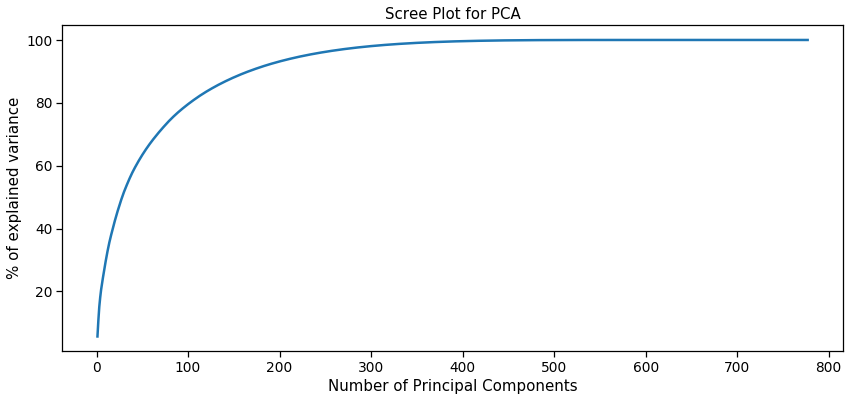

In [99]:
# Scree plot
plt.title("Scree Plot for PCA")
plt.xlabel("Number of Principal Components")
plt.ylabel("% of explained variance")

# Plot cumulative percentage
plt.plot(comps, pca.explained_variance_ratio_.cumsum()*100)
plt.show()

In [100]:
#Keep only the number of components required to explain 90% of the data
pca = PCA(0.9, random_state=42)
pca.fit(X_full)
print(pca.n_components_)

166


In [101]:
X_pca = pca.transform(X_full)
print(X_pca.shape)

(1050, 166)


In [102]:
# Alternative PCA to keep the top 10 principal components
pca_10 = PCA(10, random_state = 42)
pca_10.fit(X_full)
X_pca_10 = pca_10.transform(X_full)
# Print explained variance with 10 principal components
print(pca_10.explained_variance_ratio_.sum())

0.2964937960802104


In [103]:
# Alternative kernel PCA
kpca = KernelPCA(n_components=10, kernel='rbf', gamma=10)
X_kpca = kpca.fit_transform(X_full)

### t-SNE

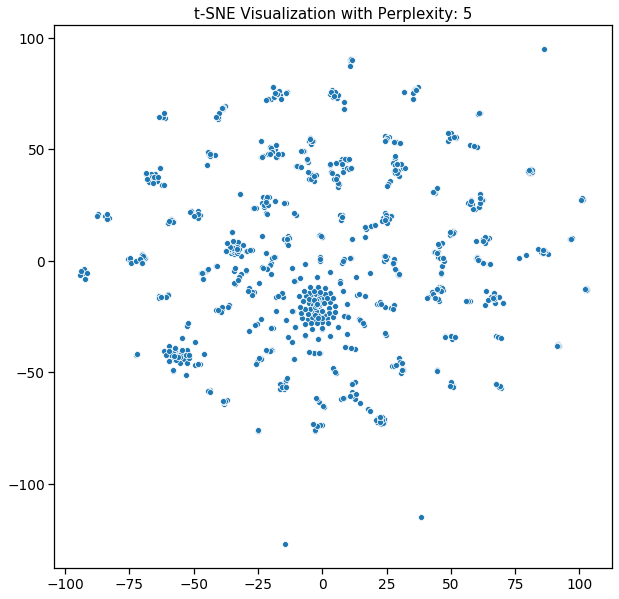

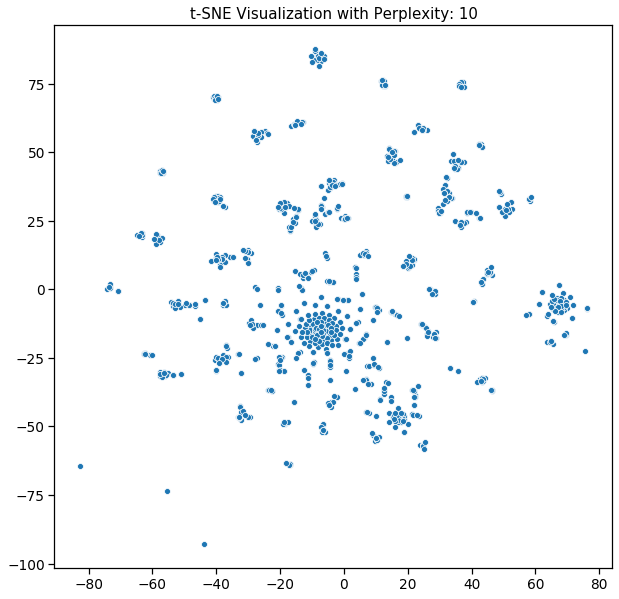

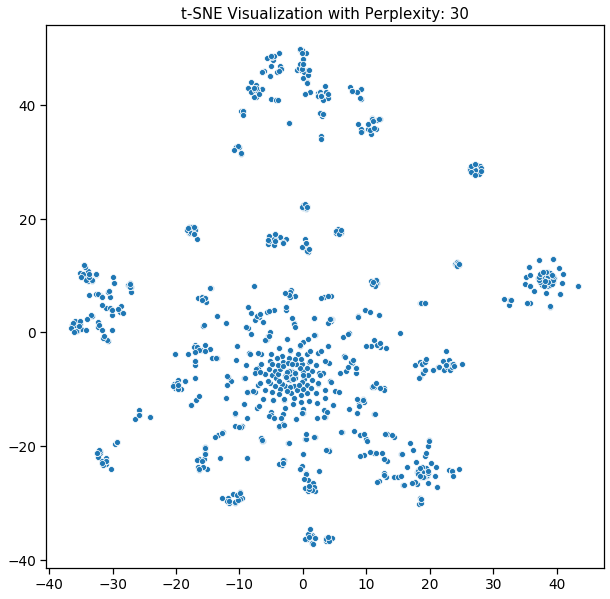

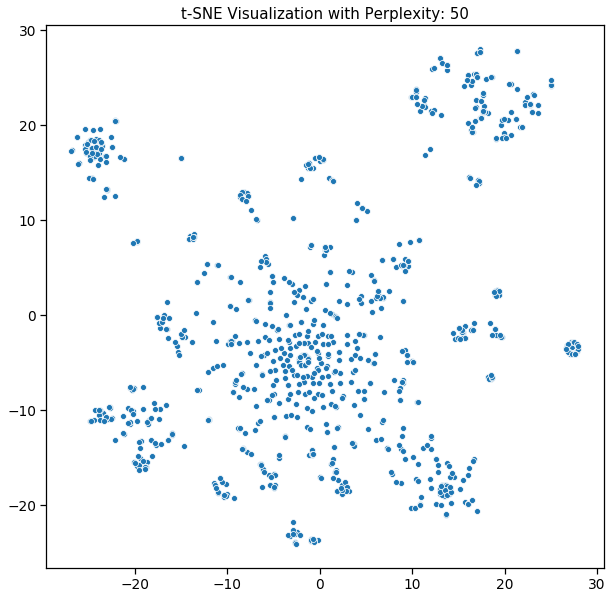

In [104]:
# Inspiration from here: https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b

# Visualize t-SNE with different levels of perplexity


perplex_list = [5, 10, 30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T = tsne.fit_transform(X_pca)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T[:, 0], T[:, 1])
    plt.show()

#### Only 10 PCAs

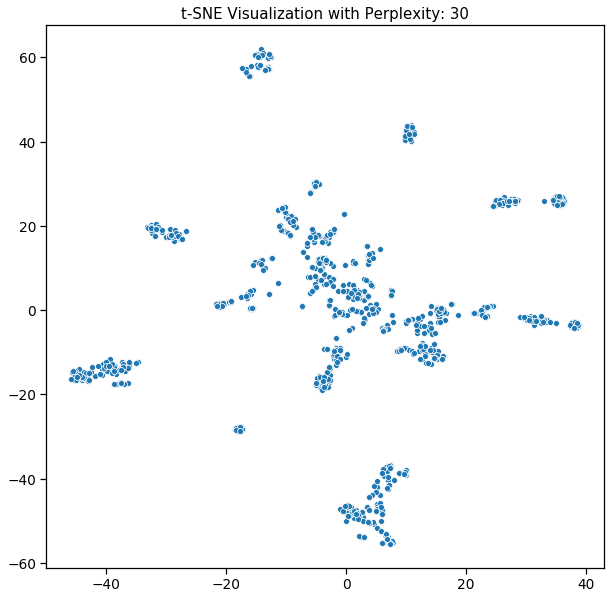

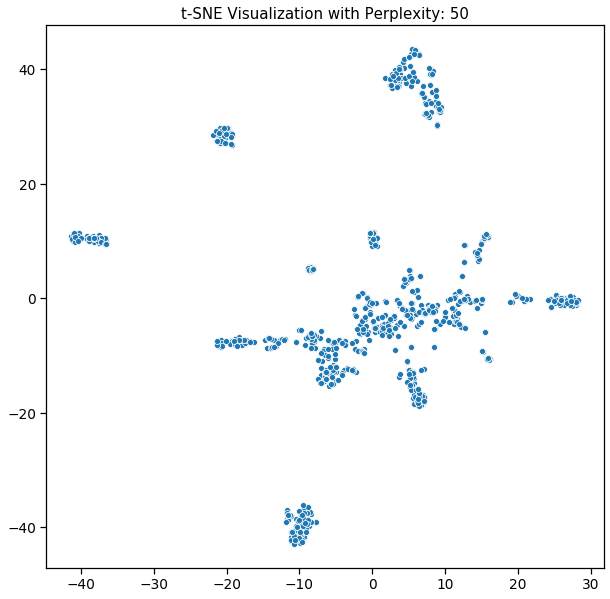

In [105]:
perplex_list = [30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T_10= tsne.fit_transform(X_pca_10)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T_10[:, 0], T_10[:, 1])
    plt.show()

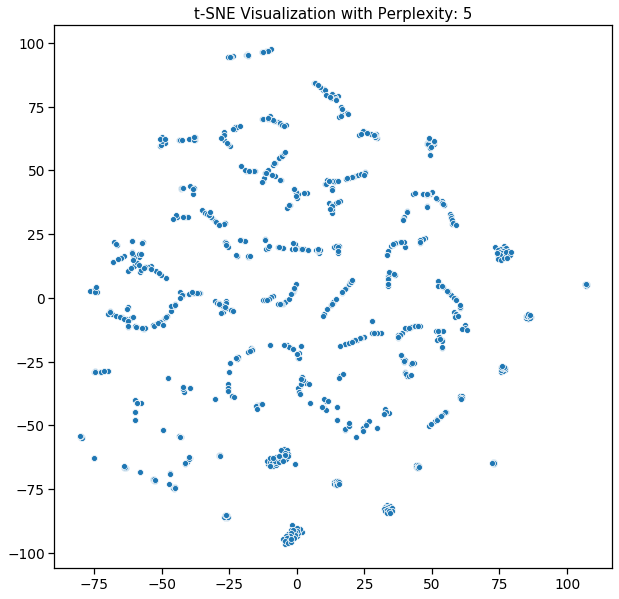

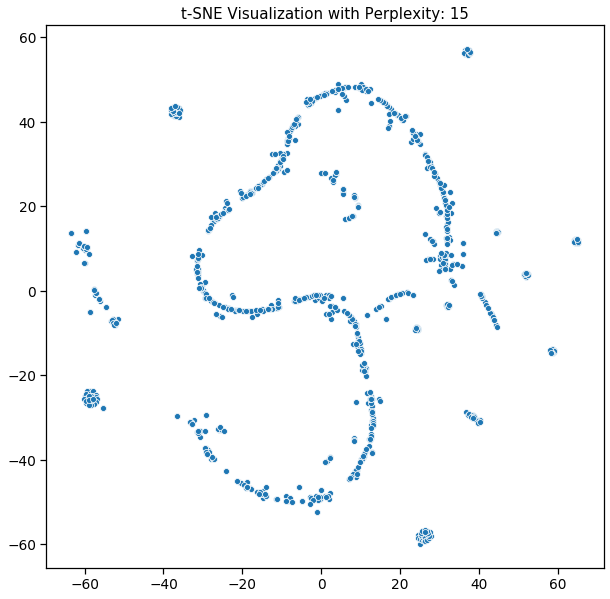

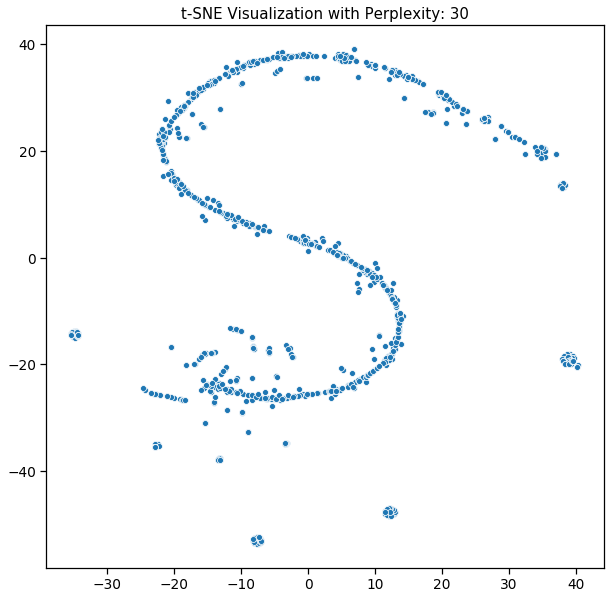

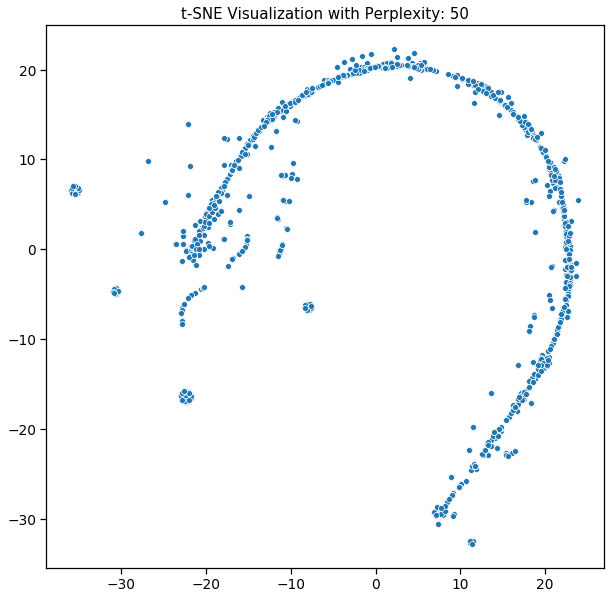

In [106]:
perplex_list = [5,15,30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T_kpca= tsne.fit_transform(X_kpca)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T_kpca[:, 0], T_kpca[:, 1])
    plt.show()

### K-Means

#### Regular PCA

In [107]:
# Find optimal number of clusters
# Method obtained from: https://towardsdatascience.com/machine-learning-algorithms-part-9-k-means-example-in-python-f2ad05ed5203

wcss = []
for i in range(1, 100):
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_pca)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

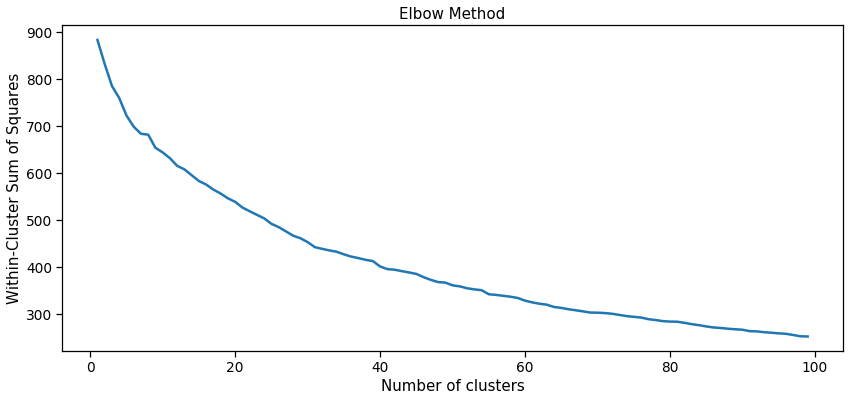

In [108]:
# Show Inertia Graph
plt.plot(range(1, 100), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [109]:
silhouette_avg = []
davies_bouldin = []

for i in range(2, 100):
    clusterer = cluster.KMeans(n_clusters=i, random_state=42)
    cluster_labels = clusterer.fit_predict(X_pca)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg.append(silhouette_score(X_pca, cluster_labels))

    # clusters which are farther apart and less dispersed will result in a better score (closer to 0)
    davies_bouldin.append(davies_bouldin_score(X_pca, cluster_labels))

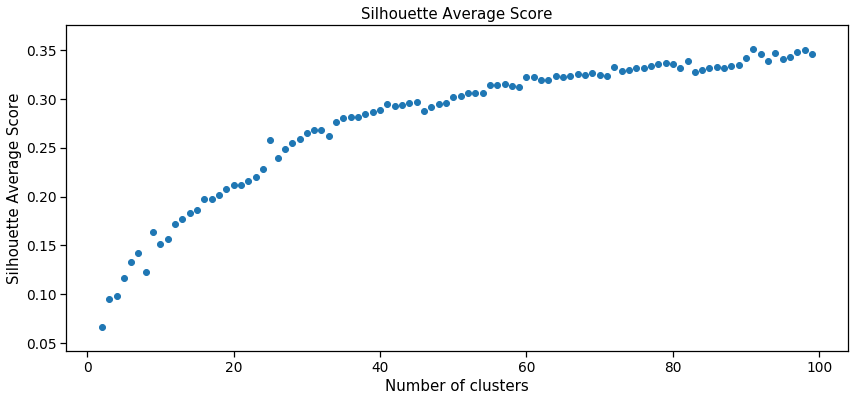

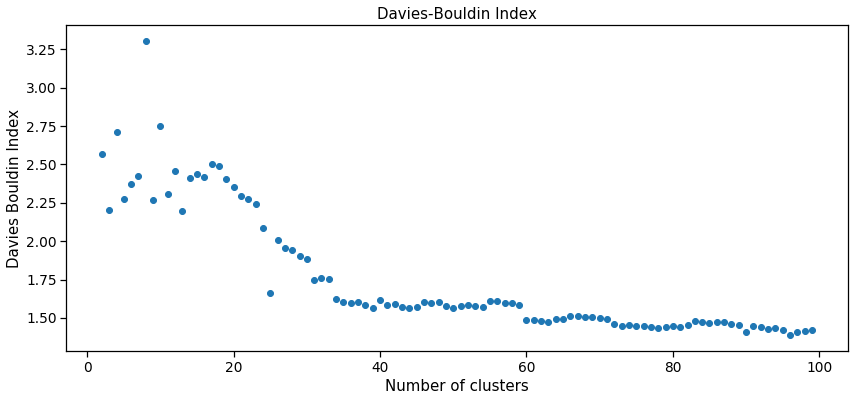

In [110]:
# Show Silhouette Graph
plt.scatter(range(2, 100), silhouette_avg)
plt.title('Silhouette Average Score')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Average Score')
plt.show()

# Show Davies Bouldin Graph
plt.scatter(range(2, 100), davies_bouldin)
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of clusters')
plt.ylabel('Davies Bouldin Index')
plt.show()

In [111]:
# Create cluster with 34 clusters
n_clusters = 34
clust = cluster.KMeans(n_clusters=n_clusters, random_state=42)
clust.fit(X_pca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=34, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

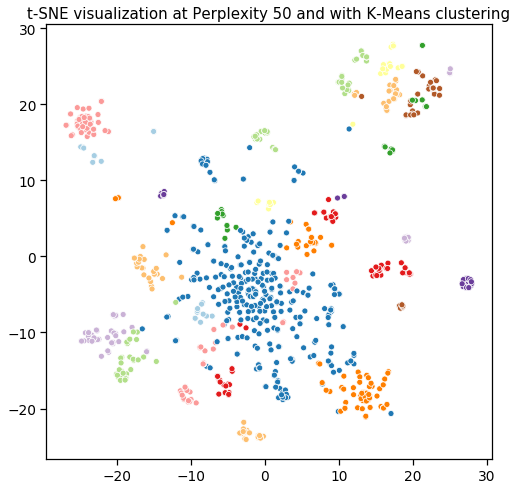

In [112]:
# Visualize fitted data on t-SNE visualization
plt.figure(figsize=(8, 8))
plt.title('t-SNE visualization at Perplexity 50 and with K-Means clustering')
sns.scatterplot(T[:, 0], T[:, 1], hue=clust.labels_, legend = False, palette=sns.color_palette("Paired", n_clusters))
plt.show()

In [113]:
#Checking for Stability of clusters at initialization
for i in range (1,10):
    clust = cluster.KMeans(n_clusters=34)
    clust.fit(X_pca)
    print(adjusted_mutual_info_score(clust.labels_, y_full))

0.5777546805029292
0.563444642496451
0.6327218219087689
0.6188511079998718
0.5840052749033774
0.6328615420431188
0.5661035478134019
0.6012715274585653
0.5886572330628835


In [114]:
#Checking for Stability of clusters with different numbers of clusters
for i in [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]:
    clust = cluster.KMeans(n_clusters=i)
    clust.fit(X_pca)
    print(f"{i}: {adjusted_mutual_info_score(clust.labels_, y_full)}")

5: 0.42428905353237756
10: 0.5527442726910533
15: 0.6105762342280467
20: 0.627788562639204
25: 0.6174982739965426
30: 0.6262660607092916
35: 0.5723646761960187
40: 0.5955420145518604
45: 0.594976913152046
50: 0.5933758945826275
55: 0.5874878383290056
60: 0.5937266925400979
65: 0.5897780715016144
70: 0.6004919130977522
75: 0.5881058661473113
80: 0.5818428964156774
85: 0.570292330828538
90: 0.5715969807838095
95: 0.5628639736637447
100: 0.5640597688827947


#### 10 PCs

In [115]:
wcss = []
for i in range(1, 30):
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_pca_10)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

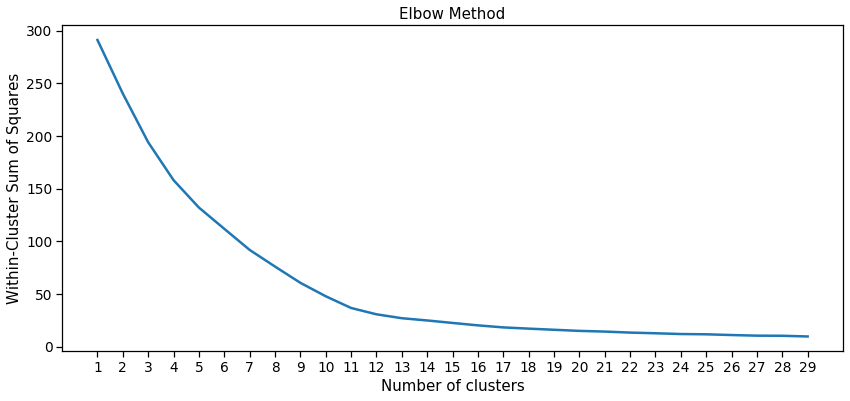

In [116]:
# Show Inertia Graph
plt.plot(range(1, 30), wcss)
plt.title('Elbow Method')
plt.xticks(range(1, 30))
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [117]:
# Create cluster with the same number of categories as what we have
n_clusters = 11
clust = cluster.KMeans(n_clusters=n_clusters, random_state=42)
clust.fit(X_pca_10)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=11, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

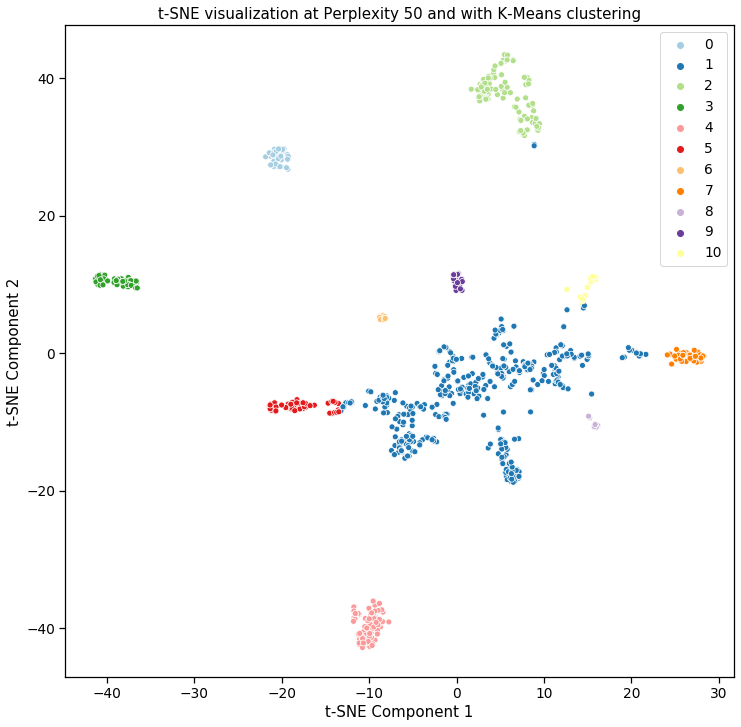

In [118]:
# Visualize fitted data on t-SNE visualization
plt.figure(figsize=(12,12))
plt.title('t-SNE visualization at Perplexity 50 and with K-Means clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
sns.scatterplot(T_10[:, 0], T_10[:, 1], hue=clust.labels_, palette=sns.color_palette("Paired", n_clusters))
plt.show()

In [119]:
# Attach labels to df
df_kmeans = df.copy()
df_kmeans['cluster_labels'] = clust.labels_

In [120]:
# Show all categories contained in each LDA topic and the number of items in each category
df_kmeans.pivot_table(values ='category_lvl_1', index = ['cluster_labels'], aggfunc = pd.Series.nunique)

,category_lvl_1
cluster_labels,
0,21
1,49
2,38
3,26
4,29
5,25
6,12
7,24
8,14


In [121]:
# Show all categories contained in each LDA topic and the number of items in each category
df_kmeans.pivot_table(values ='category_lvl_0', index = ['cluster_labels', 'category_lvl_1'], aggfunc = 'count')

category_lvl_0
cluster_labels category_lvl_1                                  
0               Bath Linen                                    2
                Bath and Spa                                  1
                Coffee Mugs                                   4
                Combos and Kits                               1
                Cookware                                      2
                Curtains & Accessories                        2
                Cushions, Pillows & Covers                    1
                Diapering & Potty Training                    1
                Dinnerware & Crockery                         1
                Floor Coverings                               1
                Fragrances                                    4
                Infant Wear                                   9
                Kitchen & Dining Linen                        1
                Kitchen Tools                                 1
                Laptop Accessories                            6
                Network Components                            2
                Showpieces                                    4
                Storage                                       1
                TRUE Home Decor & Festive Needs               1
                Table Decor & Handicrafts                     1
                Wrist Watches                                 8
1               Baby & Kids Gifts                             6
                Baby Bath & Skin                              5
                Baby Bedding                                 10
                Baby Grooming                                 2
                Bar & Glassware                               2
                Bath Linen                                    9
                Bath and Spa                                  4
                Bed Linen                                    30
                Body and Skin Care                            5
                Coffee Mugs                                  30
                Combos and Kits                              10
                Computer Components                           2
                Computer Peripherals                          2
                Containers & Bottles                          6
                Cookware                                     11
                Curtains & Accessories                        8
                Cushions, Pillows & Covers                    7
                Decorative Lighting & Lamps                   5
                Diapering & Potty Training                    4
                Eye Care                                      1
                Feeding & Nursing                             4
                Floor Coverings                               1
                Flowers, Plants & Vases                       2
                Fragrances                                   23
                Furniture & Furnishings                       2
                Hair Care                                     1
                Health Care                                   2
                Housekeeping & Laundry                        1
                Infant Wear                                  38
                JMD Home Furnishing                           1
                Kitchen & Dining Linen                        6
                Kitchen Tools                                 4
                Laptop Accessories                           41
                Lighting                                      4
                Living                                        1
                Living                                        1
                Makeup                                        7
                Men's Grooming                                1
                Network Components                           20
                Pressure Cookers & Pans                       1
                R

In [122]:
silhouette_avg = []
davies_bouldin = []
for i in range(2, 30):
    clusterer = cluster.KMeans(n_clusters=i, random_state=42)
    cluster_labels = clusterer.fit_predict(X_pca_10)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg.append(silhouette_score(X_pca_10, cluster_labels))

    # clusters which are farther apart and less dispersed will result in a better score (closer to 0)
    davies_bouldin.append(davies_bouldin_score(X_pca_10, cluster_labels))

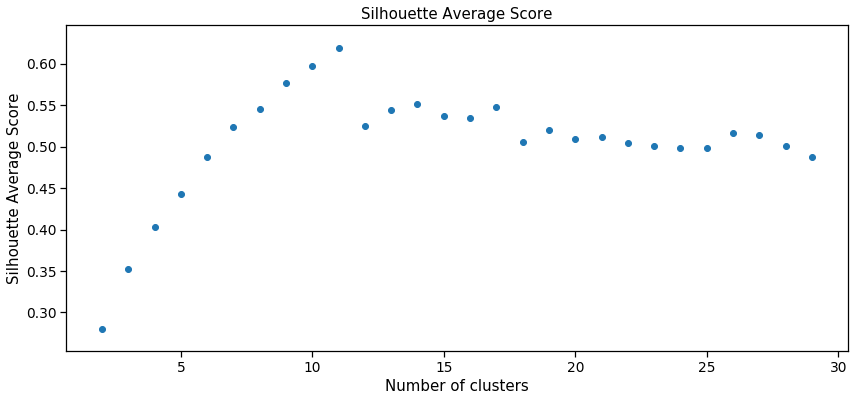

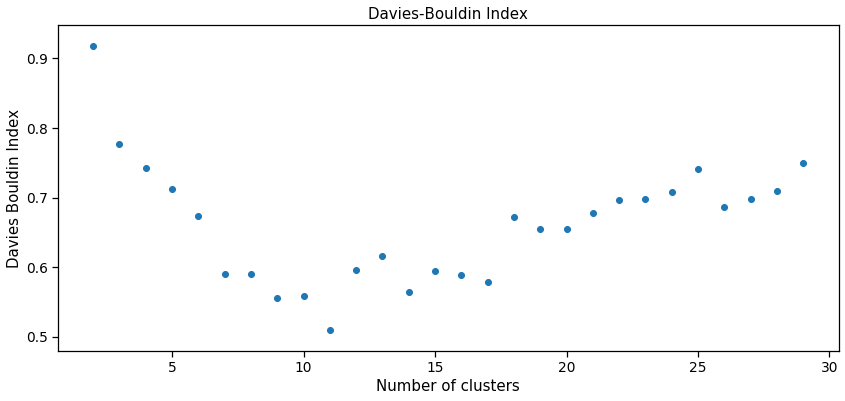

In [123]:
# Show Silhouette Graph
plt.scatter(range(2, 30), silhouette_avg)
plt.title('Silhouette Average Score')
#plt.xticks(range(2, 100))
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Average Score')
plt.show()

# Show Davies Bouldin Graph
plt.scatter(range(2, 30), davies_bouldin)
plt.title('Davies-Bouldin Index')
#plt.xticks(range(2, 100))
plt.xlabel('Number of clusters')
plt.ylabel('Davies Bouldin Index')
plt.show()

#### Kernel PCA

In [124]:
wcss = []
for i in range(1, 30):
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_kpca)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

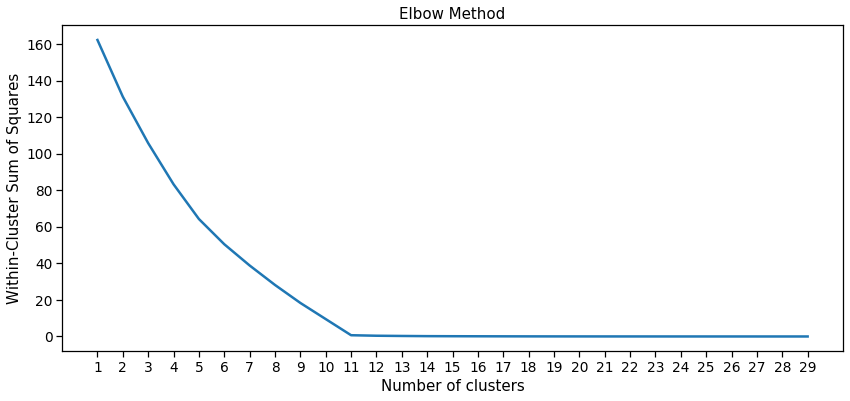

In [125]:
# Show Inertia Graph
plt.plot(range(1, 30), wcss)
plt.title('Elbow Method')
plt.xticks(range(1, 30))
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [126]:
# Create cluster with the same number of categories as what we have
n_clusters = 11
clust = cluster.KMeans(n_clusters=n_clusters, random_state=42)
clust.fit(X_kpca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=11, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

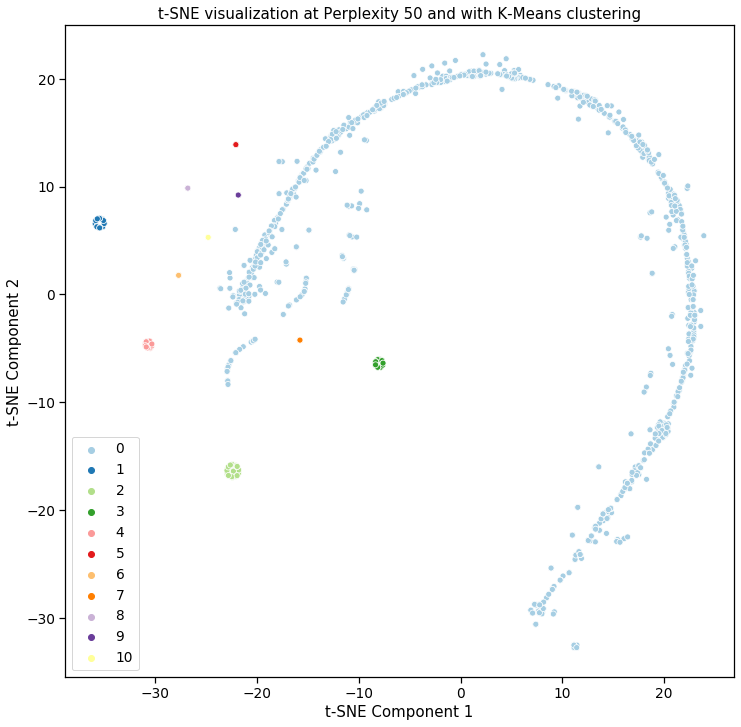

In [127]:
# Visualize fitted data on t-SNE visualization
plt.figure(figsize=(12,12))
plt.title('t-SNE visualization at Perplexity 50 and with K-Means clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
sns.scatterplot(T_kpca[:, 0], T_kpca[:, 1], hue=clust.labels_, palette=sns.color_palette("Paired", n_clusters))
plt.show()

### DBSCAN

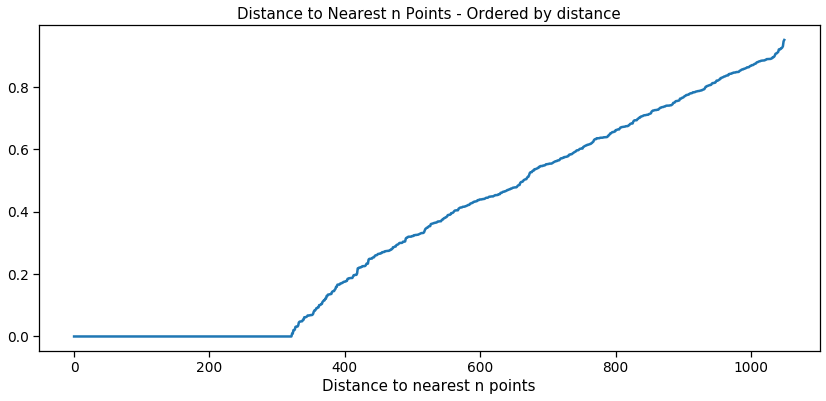

In [128]:
# Finding optimal parameters
# Methodology based on following article: https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.xlabel("Distance to nearest n points")
plt.title("Distance to Nearest n Points - Ordered by distance")
plt.show()

In [129]:
# Per above graph, critical change in curvature occuring around the point where eps = 4
clust = cluster.DBSCAN(eps=0.01)
clust.fit(X_pca)

DBSCAN(algorithm='auto', eps=0.01, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

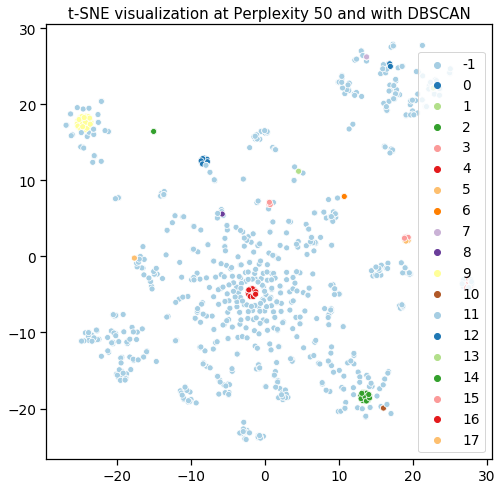

In [130]:
# Visualize clusters on t-SNE visualization
plt.figure(figsize=(8, 8))
plt.title('t-SNE visualization at Perplexity 50 and with DBSCAN')
sns.scatterplot(T[:, 0], T[:, 1], hue=clust.labels_, legend='full',
                palette=sns.color_palette("Paired", len(set(clust.labels_.tolist()))))
plt.show()

In [131]:
# Generate Silhouette and Davies Boouldin scores
cluster_labels = clust.fit_predict(X_pca)
print(
    f'Silhouette Score: {silhouette_score(X_pca, cluster_labels)}')
print(
    f'Davies Bouldin Index: {davies_bouldin_score(X_pca, cluster_labels)}')

Silhouette Score: -0.09268118744783677
Davies Bouldin Index: 1.4128251522964803


#### 10 PCs

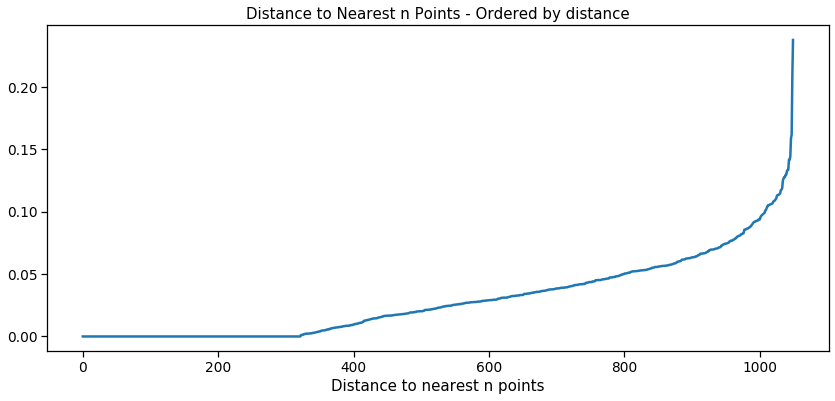

In [132]:
# Finding optimal parameters
# Methodology based on following article: https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca_10)
distances, indices = nbrs.kneighbors(X_pca_10)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.xlabel("Distance to nearest n points")
plt.title("Distance to Nearest n Points - Ordered by distance")
plt.show()

In [133]:
# Per above graph, critical change in curvature occuring around the point where eps = 4
clust = cluster.DBSCAN(eps=0.1)
clust.fit(X_pca_10)

DBSCAN(algorithm='auto', eps=0.1, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

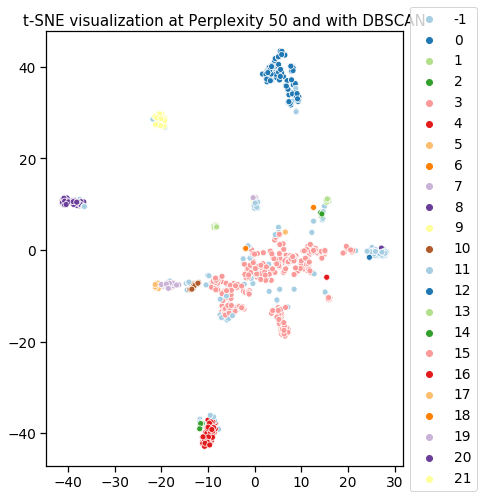

In [134]:
# Visualize clusters on t-SNE visualization
plt.figure(figsize=(8, 8))
ax = plt.subplot()
plt.title('t-SNE visualization at Perplexity 50 and with DBSCAN')
sns.scatterplot(T_10[:, 0], T_10[:, 1], hue=clust.labels_, legend='full',
                palette=sns.color_palette("Paired", len(set(clust.labels_.tolist()))))

# Make plot area smaller
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [135]:
# Generate Silhouette and Davies Boouldin scores
cluster_labels = clust.fit_predict(X_pca_10)
print(
    f'Silhouette Score: {silhouette_score(X_pca_10, cluster_labels)}')
print(
    f'Davies Bouldin Index: {davies_bouldin_score(X_pca_10, cluster_labels)}')

Silhouette Score: 0.376174357447879
Davies Bouldin Index: 1.0899785659516918


#### Kernel PCA

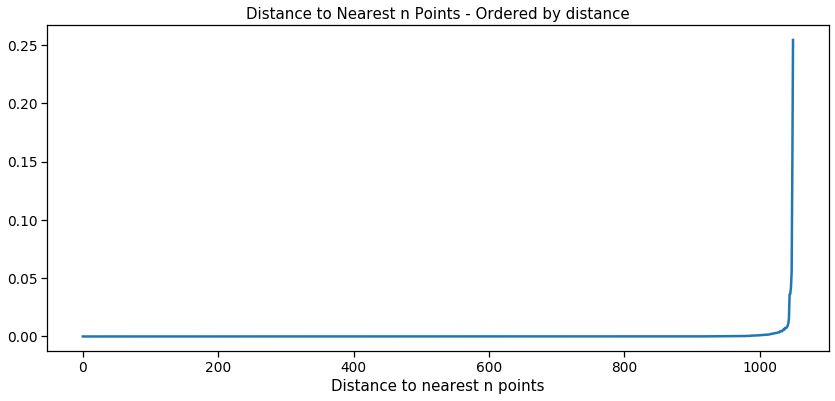

In [136]:
# Finding optimal parameters
# Methodology based on following article: https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_kpca)
distances, indices = nbrs.kneighbors(X_kpca)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.xlabel("Distance to nearest n points")
plt.title("Distance to Nearest n Points - Ordered by distance")
plt.show()

In [137]:
# Per above graph, critical change in curvature occuring around the point where eps = 4
clust = cluster.DBSCAN(eps=0.01)
clust.fit(X_kpca)

DBSCAN(algorithm='auto', eps=0.01, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  after removing the cwd from sys.path.


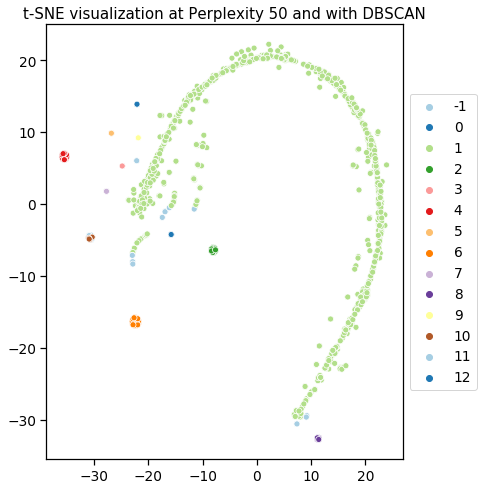

In [138]:
# Plot on Kernel PCA
plt.figure(figsize=(8, 8))
plt.title('t-SNE visualization at Perplexity 50 and with DBSCAN')
ax = plt.subplot()
sns.scatterplot(T_kpca[:, 0], T_kpca[:, 1], hue=clust.labels_, legend='full',
                palette=sns.color_palette("Paired", len(set(clust.labels_.tolist()))))

# Make plot area smaller
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

<b>Conclusion</b>: A few clusters seem to come out using the K-Means algorithm and 10 principal components. However, we are still looking at one very large cluster representing a lot of the data and we are still only explaining a small amount (30%) of our variance using these 10 PCs.

## Image Treatment

### Pre-Treatment

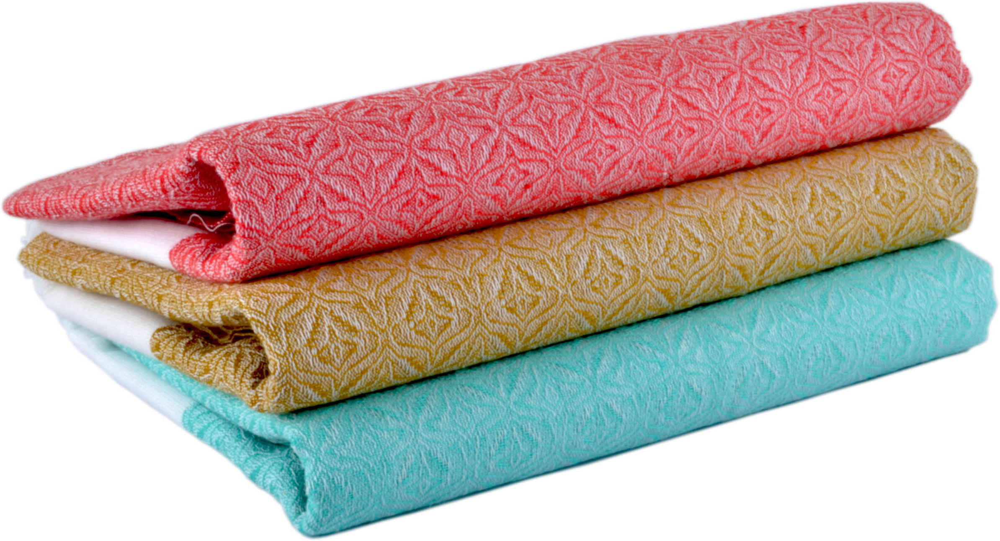

In [139]:
#Open example picture
img = Image.open(f"Flipkart/Images/{df.iloc[1]['image']}")
img

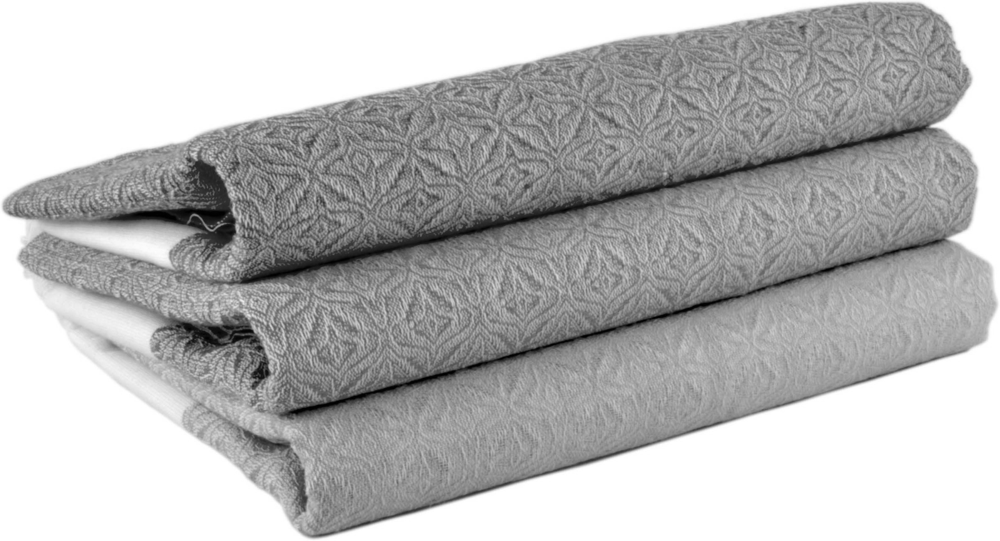

In [140]:
#Convert to Grayscale
img = img.convert('L')
img

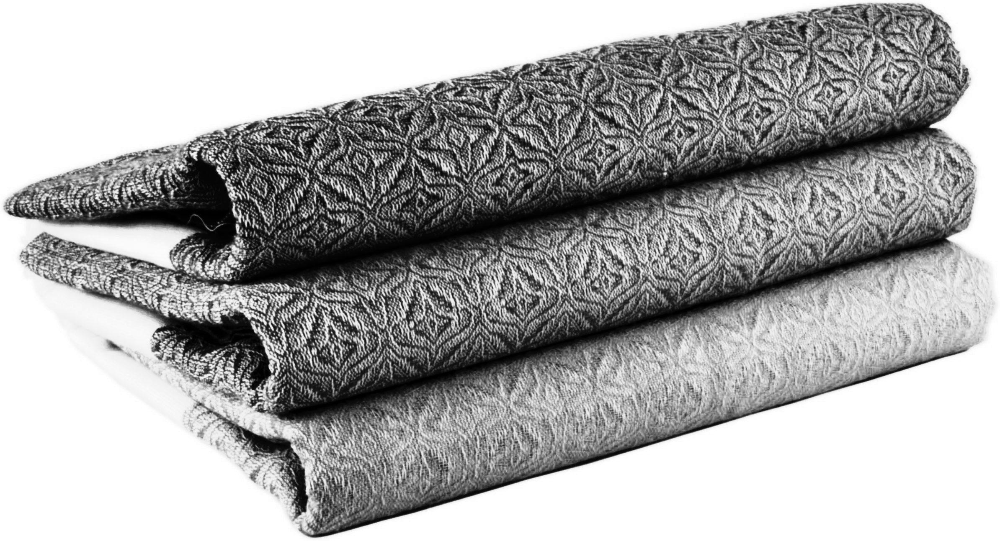

In [141]:
#Equalize image
img = ImageOps.equalize(img)
img

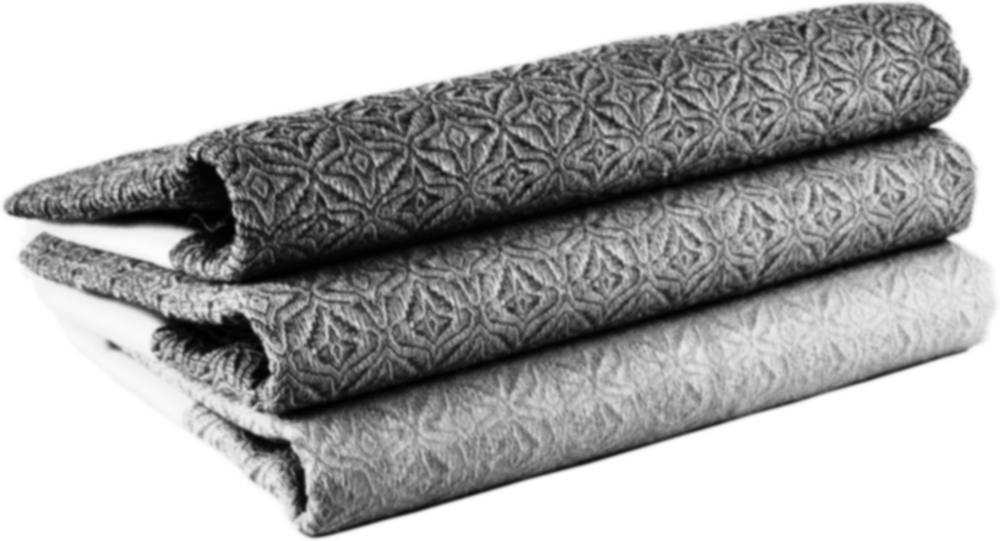

In [142]:
#Filter 
img = img.filter(ImageFilter.GaussianBlur(radius = 3))
img

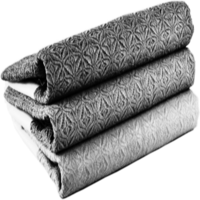

In [143]:
#Resize
img = img.resize((200,200))
img

In [144]:
#Convert to array
mat = np.array(img)
mat.shape

(200, 200)

In [145]:
#Create function for image treatment
def image_treatment(img):
    img_treated = Image.open(img) # Open image
    img_treated = img_treated.convert('L') # Convert to grayscale
    img_treated = ImageOps.equalize(img_treated) #Equalize distribution
    img_treated = img_treated.filter(ImageFilter.GaussianBlur(radius = 3)) # Blur
    img_treated = img_treated.resize((200,200)) #Resize to 200x200
    img_treated = np.array(img_treated)
    return img_treated

In [146]:
#This is what we retrieve when running an image through the image_treatment function 
image_treatment("Flipkart/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg")

array([[204, 203, 204, ..., 159, 159, 159],
       [214, 214, 214, ..., 161, 160, 160],
       [215, 215, 215, ..., 161, 161, 160],
       ...,
       [151, 150, 150, ...,  89,  89,  95],
       [162, 163, 163, ...,  93,  94, 103],
       [172, 173, 172, ..., 102,  99, 107]], dtype=uint8)

### Feature Extraction with SIFT

In [147]:
mat = np.array(img)

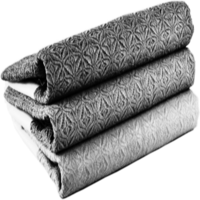

In [148]:
Image.fromarray(mat)

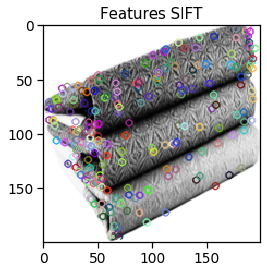

In [149]:
#Initiate SIFT algorithm
sift = cv2.xfeatures2d.SIFT_create()
key_points = sift.detect(mat,None)
img_sift = cv2.drawKeypoints(mat,key_points, mat)
img_sift_orient = cv2.drawKeypoints(mat,key_points, mat, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Show key points without orientation
plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img_sift);

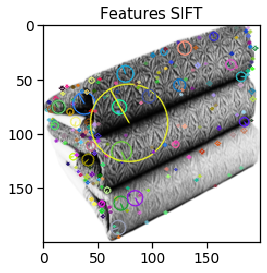

In [150]:
#Show key points with orientation
plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img_sift_orient);

### Bag of Visual Words

In [151]:
# Code based on following: https://medium.com/@aybukeyalcinerr/bag-of-visual-words-bovw-db9500331b2f
# Another option: https://medium.com/@aybukeyalcinerr/bag-of-visual-words-bovw-db9500331b2f

In [152]:
#Load the numpy arrays for every image in the training set
image_list_train = []
for i in train_df['image']:
    image_list_train.append(image_treatment(f"Flipkart/Images/{i}"))
    
#Randomizing list to test best number of clusters later on
random_image_list = image_list_train.copy()
random.shuffle(random_image_list) 
image_list_small = random_image_list[0:30]

In [153]:
#Load the numpy arrays for every image in the testing set
image_list_test = []
for i in test_df['image']:
    image_list_test.append(image_treatment(f"Flipkart/Images/{i}"))

/opt/anaconda3/lib/python3.7/site-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [154]:
# Create function to build the feature histograms
def build_histogram(descriptor_list, cluster_alg):
    histogram = np.zeros(len(cluster_alg.cluster_centers_)) # Creates an array filled with zeros of length of the number of clusters
    cluster_result =  cluster_alg.predict(descriptor_list) # Assigns each feature to a cluster
    for i in cluster_result:
        histogram[i] += 1.0 #Adds a point for each feature assigned to a cluster
    return histogram

In [155]:
#Step 1 - Generate key points and descriptors on small dataset
# We will determine the ideal number of clusters to group the features into

#Generate SIFT
sift = cv2.xfeatures2d.SIFT_create()

#Generate list of descriptors
descriptors = []

for i in image_list_small:
    kp, des = sift.detectAndCompute(i, None) #Generate key points and descriptors for each image
    for d in des:
        descriptors.append(d) #Append descritors for every image to the descriptors list

In [156]:
wcss = []
for i in [100,200,300,400,500,600,700]:
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(descriptors)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

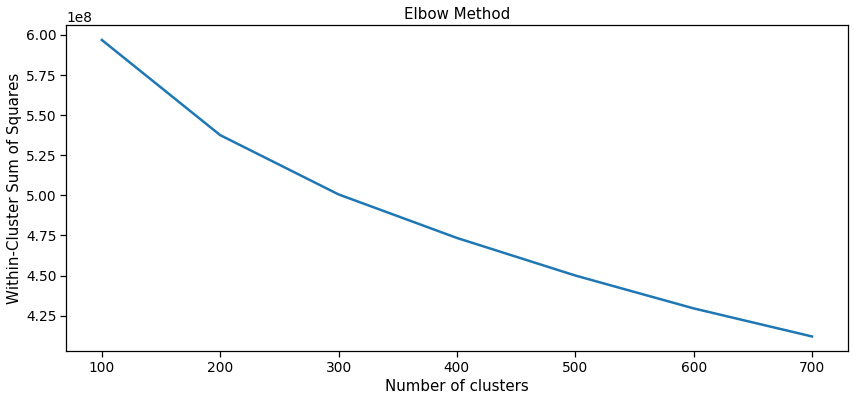

In [157]:
# Show Inertia Graph
plt.plot([100,200,300,400,500,600,700], wcss)
plt.title('Elbow Method')
#plt.xticks(range(1, 100))
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

<b>Conclusion</b>: 200 clusters seems to show a bit of an elbow so we will use this. There are different schools of thought on how many clusters to use. In an ideal situation we would test out more numbers of clusters on the full dataset, however, this would require a lot of time and computational power so 200 was deemed sufficient in the context of this analysis.

In [158]:
#Step 1 - Generate key points and descriptors for training data

#Generate SIFT
sift = cv2.xfeatures2d.SIFT_create()

#Generate list of descriptors
descriptors = []

for i in image_list_train:
    kp, des = sift.detectAndCompute(i, None) #Generate key points and descriptors for each image
    for d in des:
        descriptors.append(d) #Append descritors for every image to the descriptors list

In [161]:
#Step 2 - Generate clusters

kmeans = KMeans(n_clusters = 200)
kmeans.fit(descriptors)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=200, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [162]:
#Step 3 - Generate histograms for every image in the training data

histogram_list = []
for i in image_list_train:
    kp, des = sift.detectAndCompute(i, None)
    if (des is not None):
        histogram = build_histogram(des, kmeans)
        histogram_list.append(histogram)

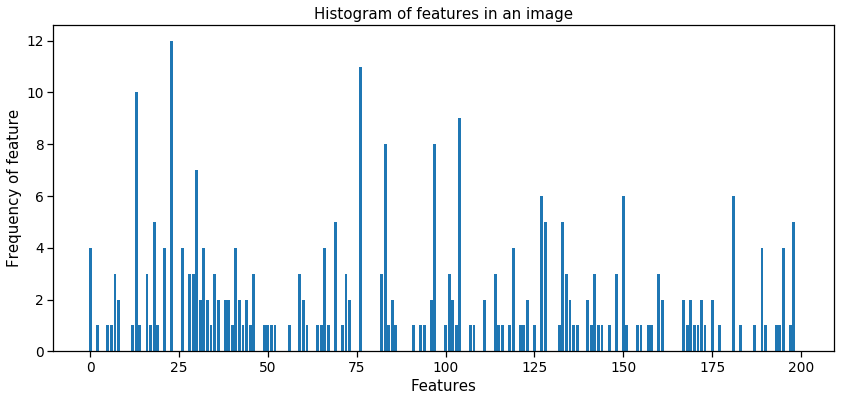

In [163]:
#Example of a histogram
plt.bar(x = range(0,len(kmeans.cluster_centers_)), height = histogram_list[0])
plt.title('Histogram of features in an image')
plt.ylabel('Frequency of feature')
plt.xlabel('Features')
plt.show()

In [164]:
#Step 4 - Assign histograms and labels to training variables
X_train = np.array(histogram_list)
y_train = train_df['category_lvl_1']

In [165]:
#Step 5 - Generate histograms based on the test data
histogram_list_test = []
for i in image_list_test:
    kp, des = sift.detectAndCompute(i, None)
    if (des is not None):
        histogram = build_histogram(des, kmeans)
        histogram_list_test.append(histogram)

In [166]:
#Step 6 - Assign histograms and labels to test variables
X_test = np.array(histogram_list_test)
y_test = test_df['category_lvl_1']

### Supervised Learning

In [167]:
#Generating a dataframe to store the results of different models
image_results_df = pd.DataFrame(columns = ['Model', 'Training/Test', 'Accuracy %'])

#### SVC

In [168]:
#SVC
svc = SVC()
#Grid search on SVC
parameters = {'kernel' : ['rbf', 'poly'],
              'C' : np.logspace(-2, 3, 6),
              'gamma': [0.001, 0.01, 0.1, 1],
              'decision_function_shape': ['ovo', 'ovr']
              }

svc_search = GridSearchCV(estimator = svc,
                          param_grid = parameters,
                          cv = 5,
                          verbose = 10,
                          n_jobs = -1
                         )

svc_search.fit(X_train, y_train)
pred = svc_search.predict(X_test)
print(svc_search.best_params_)

Fitting 5 folds for each of 96 candidates, totalling 480 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-

{'C': 100.0, 'decision_function_shape': 'ovo', 'gamma': 0.001, 'kernel': 'rbf'}


In [169]:
#Append accuracy scores
model_name = 'SVC'
training_tf = accuracy_score(svc_search.predict(X_train), y_train)
test_tf = accuracy_score(svc_search.predict(X_test), y_test)

#Append training results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

#### k-NN

In [170]:
#KNN
knn = KNeighborsClassifier()

#Grid search on KNN
parameters = {'n_neighbors' : list(range(1, 31)),
              'weights' : ['uniform', 'distance'],
              }

knn_search = GridSearchCV(estimator = knn,
                          param_grid = parameters,
                          cv = 5,
                          verbose = 10,
                          n_jobs = -1
                         )

knn_search.fit(X_train, y_train)
pred = knn_search.predict(X_test)
print(knn_search.best_params_)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0986s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1003s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 232 tasks 

{'n_neighbors': 12, 'weights': 'distance'}


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.3s finished


In [171]:
#Append accuracy scores
model_name = 'kNN'
training_tf = accuracy_score(knn_search.predict(X_train), y_train)
test_tf = accuracy_score(knn_search.predict(X_test), y_test)

#Append training results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

#### Linear SVC

In [172]:
# Linear SVC


linear_svc = LinearSVC(max_iter = 5000)
#Grid search on SVC
parameters = {'penalty' : ['l1', 'l2'],
              'loss' : ['hinge', 'squared_hinge'],
              'C' : np.logspace(-2, 3, 6)
              }

linear_svc_search = GridSearchCV(estimator = linear_svc,
                          param_grid = parameters,
                          cv = 5,
                          verbose = 10,
                          n_jobs = -1
                         )

linear_svc_search.fit(X_train, y_train)
pred = linear_svc_search.predict(X_test)
print(linear_svc_search.best_params_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0152s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0653s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0299s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 109 out of 120 | elapsed:    5.9s remaining:    0.6

{'C': 0.01, 'loss': 'hinge', 'penalty': 'l2'}


In [173]:
#Append accuracy scores
model_name = 'Linear SVC'
training_tf = accuracy_score(linear_svc_search.predict(X_train), y_train)
test_tf = accuracy_score(linear_svc_search.predict(X_test), y_test)

#Append training results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

#### Logistic Regression

In [174]:
lr = LogisticRegression(max_iter = 1000)

params_lr = {'C' : np.logspace(-2, 3, 6),
             'penalty' : ['l1', 'l2', 'elasticnet'],
             'solver' : ['newton-cg', 'lbfgs', 'liblinear']
            }

lr_search = GridSearchCV(estimator = lr, 
                  param_grid = params_lr,
                  cv = 3,
                  verbose = True,
                  n_jobs = -1
                 )

lr_search.fit(X_train, y_train)
pred = lr_search.predict(X_test)
print(lr_search.best_params_)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 162 out of 162 | elapsed:   28.1s finished


{'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}


In [175]:
#Append accuracy scores
model_name = 'Logistic Regression'
training_tf = accuracy_score(lr_search.predict(X_train), y_train)
test_tf = accuracy_score(lr_search.predict(X_test), y_test)

#Append training results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Training',
                            'Accuracy %': training_tf
                           }, ignore_index = True)

#Append test results
image_results_df = image_results_df.append({'Model': model_name,
                            'Training/Test': 'Test',
                            'Accuracy %': test_tf
                           }, ignore_index = True)

In [176]:
image_results_df

,Model,Training/Test,Accuracy %
0,SVC,Training,1.000000
1,SVC,Test,0.309524
2,kNN,Training,1.000000
3,kNN,Test,0.266667
4,Linear SVC,Training,0.857143
5,Linear SVC,Test,0.266667
6,Logistic Regression,Training,0.792857
7,Logistic Regression,Test,0.357143


<b>Conclusion</b>: Pretty poor results and overfitting of the training data, which is not surprising given the size and the distribution of the dataset

### Unsupervised Learning

#### Dimensional Reduction (PCA)

In [177]:
#Re-joining Train and Test datasets for this exercise
X_image_full = np.concatenate([X_train, X_test])

In [178]:
# Re-joing the target data for this exercise
y_image_full = np.concatenate([y_train, y_test])

In [179]:
pca = PCA(random_state=42)
pca.fit(X_image_full)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [180]:
# Making list of principal components
comps = list(range(X_image_full.shape[1]))
comps = [item+1 for item in comps]

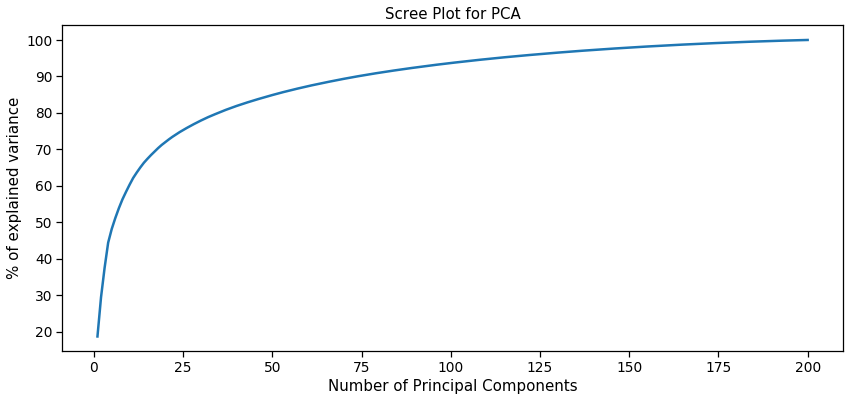

In [181]:
# Scree plot
plt.title("Scree Plot for PCA")
plt.xlabel("Number of Principal Components")
plt.ylabel("% of explained variance")

# Plot cumulative percentage
plt.plot(comps, pca.explained_variance_ratio_.cumsum()*100)
plt.show()

In [182]:
#Keep only the number of components required to explain 90% of the data
pca = PCA(0.9, random_state=42)
pca.fit(X_image_full)
print(pca.n_components_)

74


In [183]:
X_image_pca = pca.transform(X_image_full)
print(X_image_pca.shape)

(1050, 74)


In [184]:
# Keep only fthe first 10 components
pca_10 = PCA(10, random_state=42)
pca_10.fit(X_image_full)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [185]:
X_image_pca_10 = pca_10.transform(X_image_full)
print(X_image_pca_10.shape)
#Explained variance with first 10 components
print(pca_10.explained_variance_ratio_.sum())

(1050, 10)
0.6032499511352503


In [186]:
# Alternative kernel PCA
kpca = KernelPCA(n_components=10, kernel='poly', gamma=10)
X_kpca = kpca.fit_transform(X_image_full)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


### t-SNE

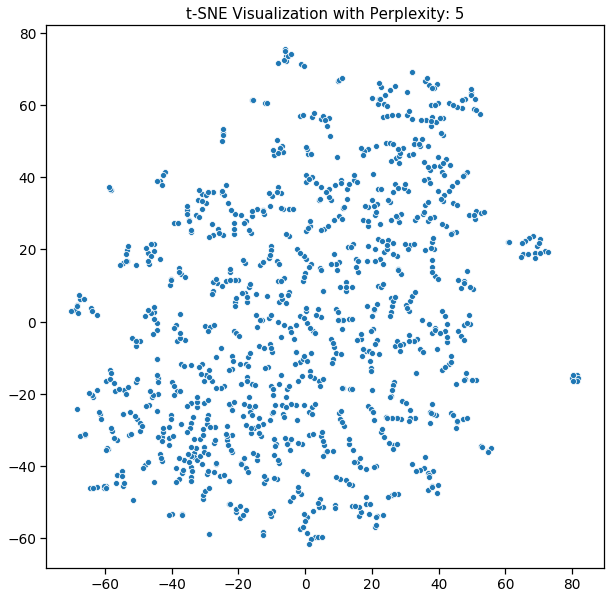

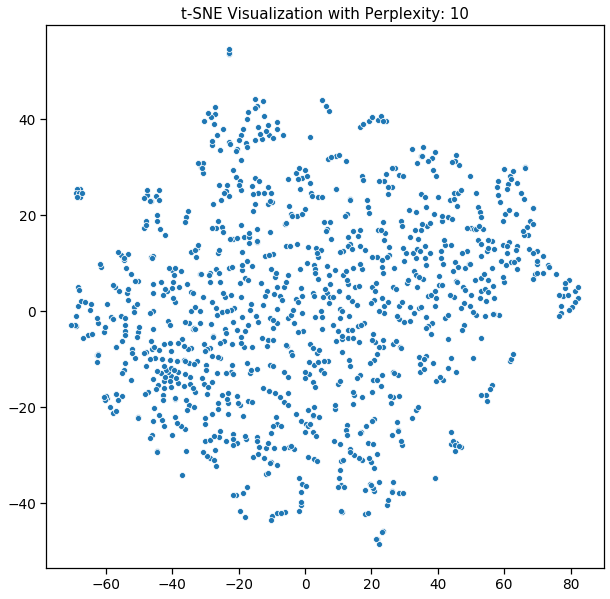

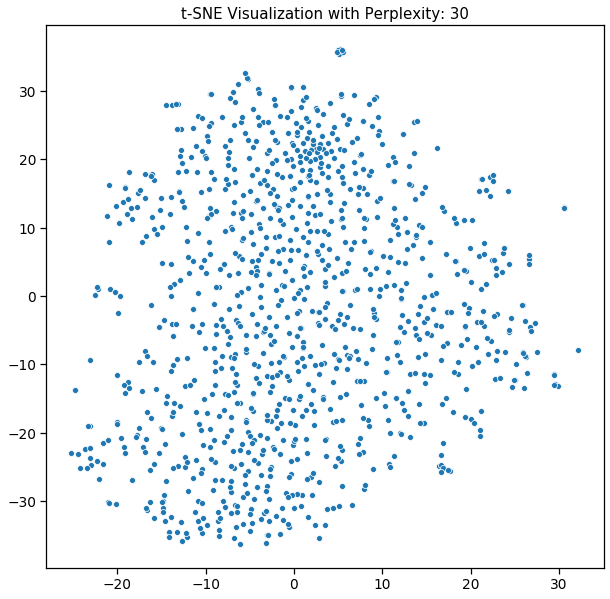

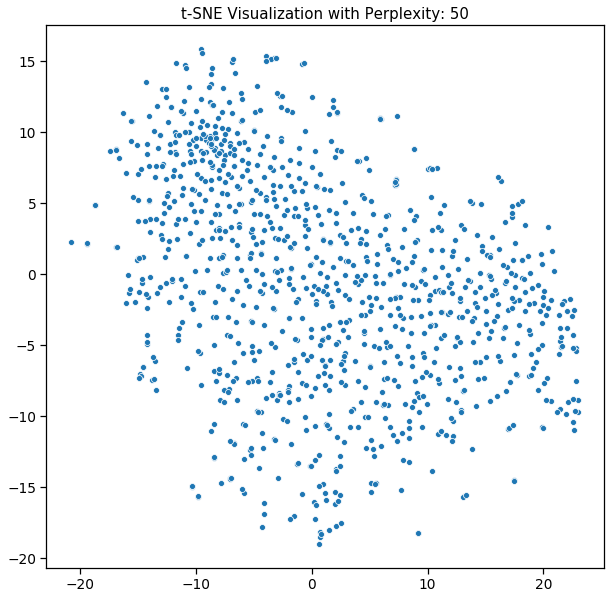

In [187]:
# Inspiration from here: https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b

# Visualize t-SNE with different levels of perplexity


perplex_list = [5, 10, 30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T = tsne.fit_transform(X_image_pca)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T[:, 0], T[:, 1])
    plt.show()

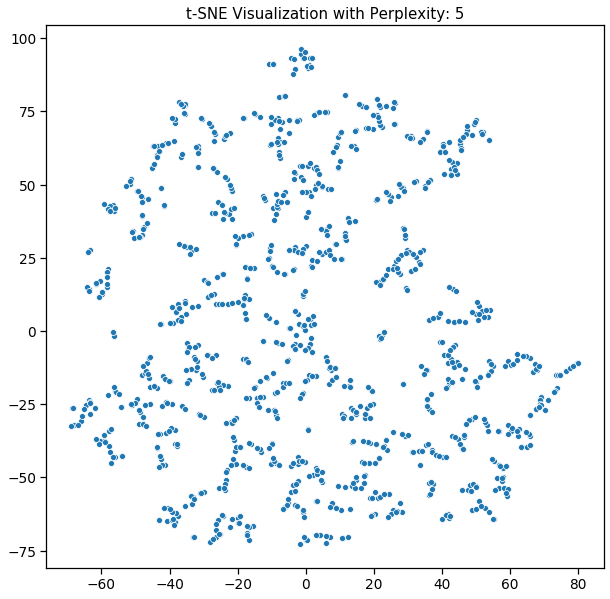

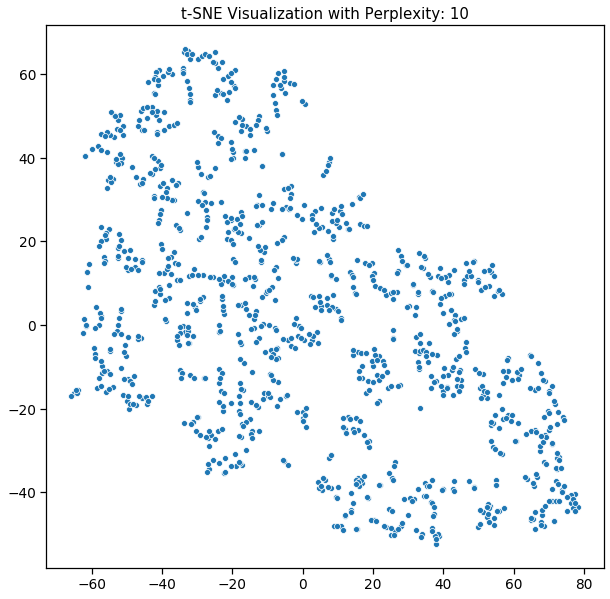

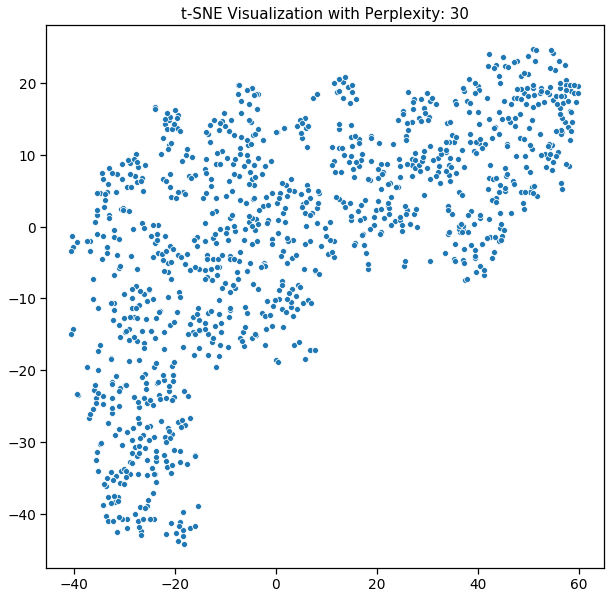

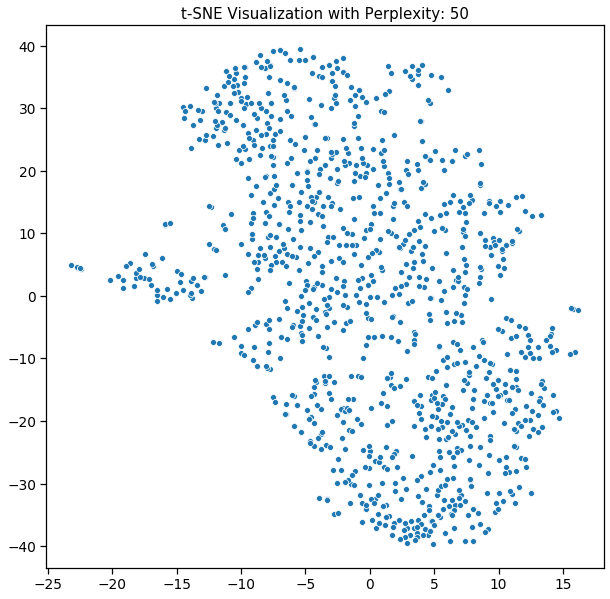

In [188]:
perplex_list = [5, 10, 30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T_10 = tsne.fit_transform(X_image_pca_10)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T_10[:, 0], T_10[:, 1])
    plt.show()

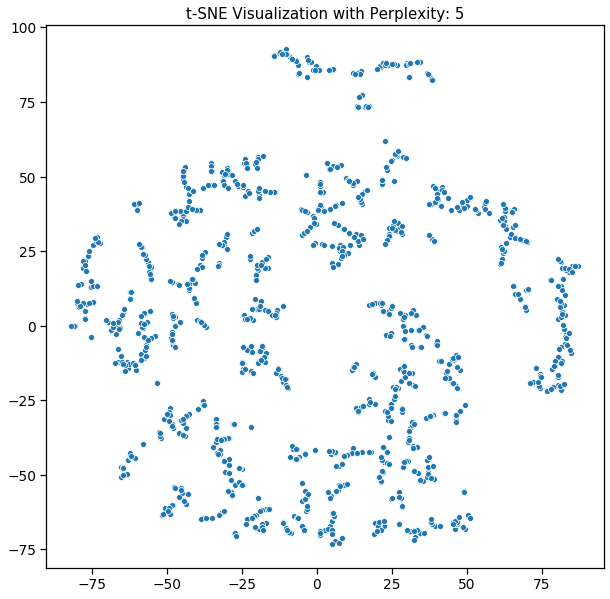

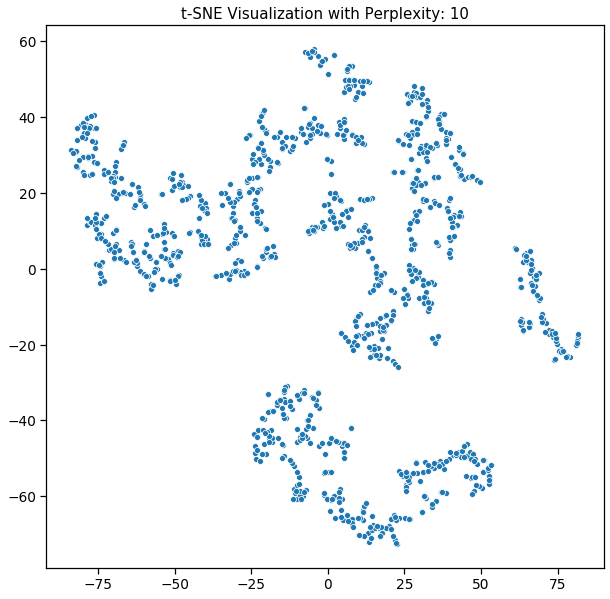

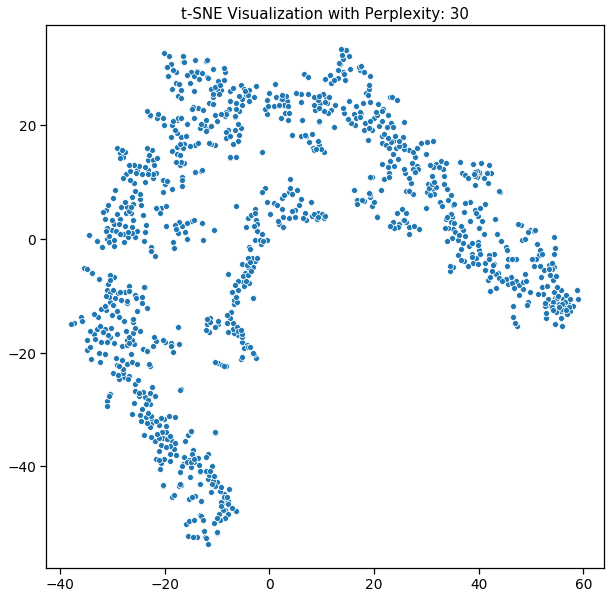

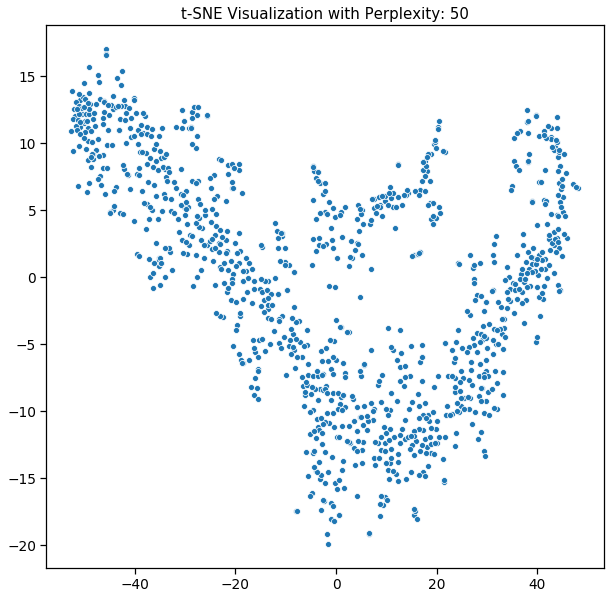

In [189]:
# Inspiration from here: https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b

# Visualize t-SNE with different levels of perplexity


perplex_list = [5, 10, 30, 50]
for i in perplex_list:
    # Run t-SNE
    tsne = TSNE(n_components=2, perplexity=i, random_state=42)
    T_kpca = tsne.fit_transform(X_kpca)

    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f't-SNE Visualization with Perplexity: {i}')
    sns.scatterplot(T_kpca[:, 0],T_kpca[:, 1])
    plt.show()

In [190]:
# Find optimal number of clusters
wcss = []
for i in range(1, 30):
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_image_pca_10)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

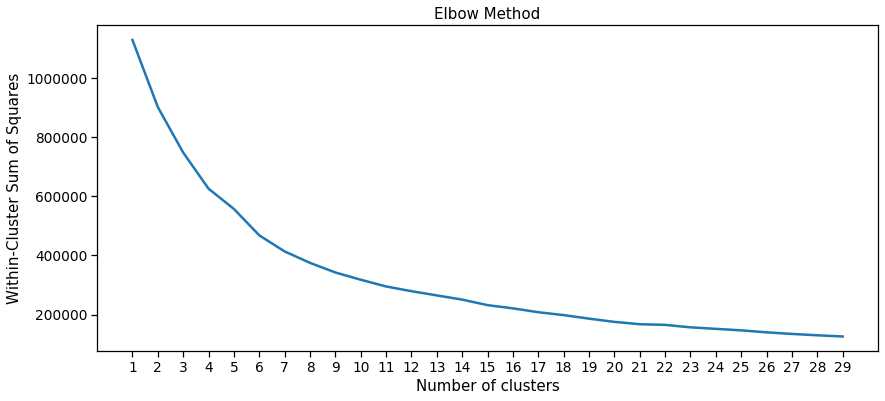

In [191]:
# Show Inertia Graph
plt.plot(range(1, 30), wcss)
plt.title('Elbow Method')
plt.xticks(range(1, 30))
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [192]:
# Create clusters
n_clusters = 8
clust = cluster.KMeans(n_clusters=n_clusters, random_state=42)
clust.fit(X_image_pca_10)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

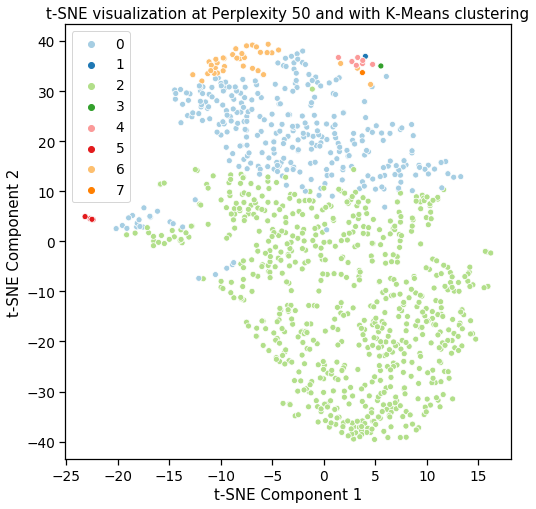

In [193]:
# Visualize fitted data on t-SNE visualization
plt.figure(figsize=(8, 8))
plt.title('t-SNE visualization at Perplexity 50 and with K-Means clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
sns.scatterplot(T_10[:, 0], T_10[:, 1], hue=clust.labels_, palette=sns.color_palette("Paired", n_clusters))
plt.show()

In [194]:
# Attach labels to df
df_kmeans['cluster_labels_images'] = clust.labels_

In [195]:
# Show all categories contained in each LDA topic and the number of items in each category
df_kmeans.pivot_table(values ='category_lvl_1', index = ['cluster_labels_images'], aggfunc = pd.Series.nunique)

,category_lvl_1
cluster_labels_images,
0,44
1,1
2,59
3,1
4,5
5,5
6,17
7,1


In [196]:
# Show all categories contained in each LDA topic and the number of items in each category
df_kmeans.pivot_table(values ='category_lvl_0', index = ['cluster_labels_images', 'category_lvl_1'], aggfunc = 'count')

category_lvl_0
cluster_labels_images category_lvl_1                                  
0                      Baby & Kids Gifts                             7
                       Baby Bath & Skin                              3
                       Baby Bedding                                  5
                       Baby Grooming                                 1
                       Bar & Glassware                               5
                       Bath Linen                                    8
                       Bath and Spa                                  2
                       Bed Linen                                    22
                       Body and Skin Care                            5
                       Coffee Mugs                                  20
                       Combos and Kits                               5
                       Computer Peripherals                          1
                       Containers & Bottles                          3
                       Cookware                                      7
                       Curtains & Accessories                        5
                       Cushions, Pillows & Covers                    3
                       Decorative Lighting & Lamps                   5
                       Diapering & Potty Training                    3
                       Feeding & Nursing                             2
                       Floor Coverings                               3
                       Flowers, Plants & Vases                       1
                       Fragrances                                   22
                       Furniture & Furnishings                       1
                       Hair Care                                     4
                       Health Care                                   1
                       Infant Wear                                  23
                       Kitchen & Dining Linen                        1
                       Kitchen Tools                                 2
                       Kripa's Home Furnishing                       1
                       Laptop Accessories                           25
                       Lighting                                      2
                       Living                                        1
                       Living Room Furnishing                        1
                       Makeup                                        4
                       Network Components                           13
                       Religion & Devotion                           1
                       Showpiece                                     2
                       Showpieces                                   30
                       Storage                                       1
                       Table Decor & Handicrafts                     6
                       Tableware & Cutlery                           1
                       Tidy Home Furnishing                          1
                       Wall Decor & Clocks                           9
                       Wrist Watches                                45
1                      Containers & Bottles                          1
2                      Baby & Kids Gifts                             8
                       Baby Bath & Skin                             11
                       Baby Bedding                                 10
                       Baby Grooming                                 2
                       Bar & Glassware                               3
                       Bath Linen                                   11
                       Bath and Spa                                  5
                       Beauty Accessories                            1
                       Bed Linen                                    39
                       Body and Skin Care                           10
         

In [197]:
# Find optimal number of clusters
wcss = []
for i in range(1, 30):
    kmeans = cluster.KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_kpca)
    # Sum of squared distances of samples to their closest cluster center.
    wcss.append(kmeans.inertia_)

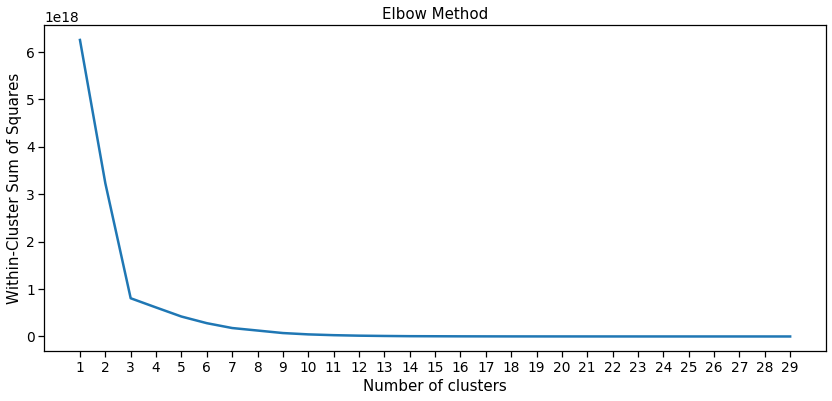

In [198]:
# Show Ineertia Graph
plt.plot(range(1, 30), wcss)
plt.title('Elbow Method')
plt.xticks(range(1, 30))
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [199]:
# Create cluster with the same number of categories as what we have
n_clusters = 3
clust = cluster.KMeans(n_clusters=n_clusters, random_state=42)
clust.fit(X_kpca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

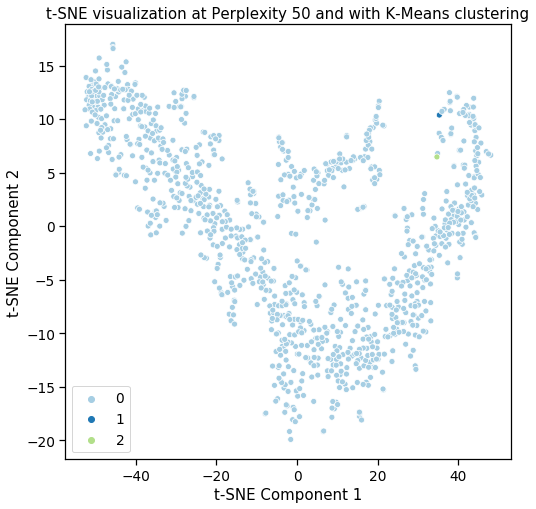

In [200]:
# Visualize fitted data on t-SNE visualization
plt.figure(figsize=(8, 8))
plt.title('t-SNE visualization at Perplexity 50 and with K-Means clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
sns.scatterplot(T_kpca[:, 0], T_kpca[:, 1], hue=clust.labels_, palette=sns.color_palette("Paired", n_clusters))
plt.show()

<b>Conclusion</b>: No distinct clusters appear based on the unsupervised learning algorithms.

### Transfer Learning

#### Using the VGG16 Categories

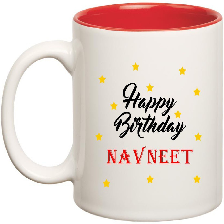

In [201]:
#Test using this image
image = load_img(f"Flipkart/Images/0c70a580d96e50966130e2885d8c3505.jpg", target_size = (224, 224))
image

In [202]:
# Based on following articles: https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
# https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/

# example of using a pre-trained model as a classifier

# load an image from file
image = load_img(f"Flipkart/Images/0c70a580d96e50966130e2885d8c3505.jpg", target_size = (224, 224))
# convert the image pixels to a numpy array
image = img_to_array(image)
# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
# load the model
model = VGG16()
# predict the probability across all output classes
yhat = model.predict(image)
# convert the probabilities to class labels
label = decode_predictions(yhat)
# retrieve the most likely result, e.g. highest probability
label = label[0][0]
# print the classification
print('%s (%.2f%%)' % (label[1], label[2]*100))

coffee_mug (76.13%)


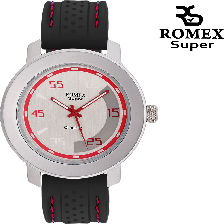

In [203]:
# Second test using another image
image = load_img(f"Flipkart/Images/0dc4d2767fe8424a3263ab141884f83d.jpg", target_size = (224, 224))
image

In [204]:
# convert the image pixels to a numpy array
image = img_to_array(image)
# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
# load the model
model = VGG16()
# predict the probability across all output classes
yhat = model.predict(image)
# convert the probabilities to class labels
label = decode_predictions(yhat)
# retrieve the most likely result, e.g. highest probability
label = label[0][0]
# print the classification
print('%s (%.2f%%)' % (label[1], label[2]*100))

magnetic_compass (82.90%)


### Using Feature extractor of model

In [205]:
#Inspiration: https://towardsdatascience.com/a-comprehensive-hands-on-guide-to-transfer-learning-with-real-world-applications-in-deep-learning-212bf3b2f27a

In [206]:
#Create function for image treatment specific to VGG16
def image_treatment_cnn(img):
    img_treated = Image.open(img) # Open image
    img_treated = img_treated.resize((224,224)) #Resize to 224x224 as this is the needed size
    img_treated = np.array(img_treated)
    return img_treated

In [207]:
# Create list of Training images
image_list_train_cnn = []
for i in train_df['image']:
    image_list_train_cnn.append(image_treatment_cnn(f"Flipkart/Images/{i}"))

In [208]:
# Create list of Test images

image_list_test_cnn = []
for i in test_df['image']:
    image_list_test_cnn.append(image_treatment_cnn(f"Flipkart/Images/{i}"))

/opt/anaconda3/lib/python3.7/site-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [209]:
# Convert to arrays of the right size

train_array_cnn = np.vstack([i.reshape(1,224,224,3) for i in image_list_train_cnn])
test_array_cnn = np.vstack([i.reshape(1,224,224,3) for i in image_list_test_cnn])

In [210]:
# Check that the arrays are of the right size
print(train_array_cnn.shape)
print(test_array_cnn.shape)

(840, 224, 224, 3)
(210, 224, 224, 3)


(224, 224, 3)


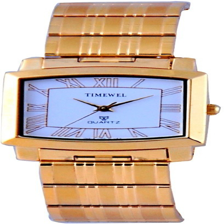

In [211]:
# Print scaled image
train_imgs_scaled = train_array_cnn.astype('float32')
validation_imgs_scaled  = test_array_cnn.astype('float32')
train_imgs_scaled /= 255
validation_imgs_scaled /= 255

print(train_array_cnn[0].shape)
array_to_img(train_array_cnn[0])

In [212]:
# load model
model = VGG16(input_shape=(224, 224, 3))
# mark loaded layers as not trainable
for layer in model.layers:
    layer.trainable = False
#Remove prediction layer
model.layers.pop()
# Add a new dense layer
vgg_transfer = Sequential()
vgg_transfer.add(model)
vgg_transfer.add(layers.Dense(n_categories, activation='softmax'))
vgg_transfer.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1000)              134260544 
_________________________________________________________________
dense_3 (Dense)              (None, 63)                63063     
Total params: 134,323,607
Trainable params: 63,063
Non-trainable params: 134,260,544
_________________________________________________________________


In [213]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [214]:
vgg_transfer.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])

In [215]:
# Fit model
history = vgg_transfer.fit(train_array_cnn, y_train_int,
                    epochs=5,
                    verbose=1,
                    validation_data=(test_array_cnn, y_test_int),
                    batch_size = 10
                   )

Train on 840 samples, validate on 210 samples
Epoch 1/5
840/840 [==============================] - 175s 209ms/step - loss: 4.0950 - accuracy: 0.2298 - val_loss: 4.0447 - val_accuracy: 0.3333
Epoch 2/5
840/840 [==============================] - 173s 206ms/step - loss: 3.9907 - accuracy: 0.4310 - val_loss: 3.9508 - val_accuracy: 0.4190
Epoch 3/5
840/840 [==============================] - 173s 206ms/step - loss: 3.8903 - accuracy: 0.4714 - val_loss: 3.8601 - val_accuracy: 0.4381
Epoch 4/5
840/840 [==============================] - 177s 210ms/step - loss: 3.7934 - accuracy: 0.5000 - val_loss: 3.7734 - val_accuracy: 0.4476
Epoch 5/5
840/840 [==============================] - 173s 206ms/step - loss: 3.6997 - accuracy: 0.5060 - val_loss: 3.6898 - val_accuracy: 0.4524


## Second Try with preprocessing

In [216]:
#Reset model altogether
K.clear_session()

In [217]:
# Trying again but this time running preprocess on the images

train_array_cnn = np.vstack([preprocess_input(i.reshape(1,224,224,3)) for i in image_list_train_cnn])
test_array_cnn = np.vstack([preprocess_input(i.reshape(1,224,224,3)) for i in image_list_test_cnn])

(224, 224, 3)


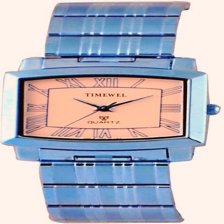

In [218]:
# View pre-processed image
train_imgs_scaled = train_array_cnn.astype('float32')
validation_imgs_scaled  = test_array_cnn.astype('float32')
train_imgs_scaled /= 255
validation_imgs_scaled /= 255

print(train_array_cnn[0].shape)
array_to_img(train_array_cnn[0])

In [219]:
# load model without classifier layers
model = VGG16(input_shape=(224, 224, 3))
# mark loaded layers as not trainable
for layer in model.layers:
    layer.trainable = False
#Remove prediction layer
model.layers.pop()
# Add a new dense layer
vgg_transfer = Sequential()
vgg_transfer.add(model)
vgg_transfer.add(layers.Dense(n_categories, activation='softmax'))
vgg_transfer.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1000)              134260544 
_________________________________________________________________
dense_1 (Dense)              (None, 63)                63063     
Total params: 134,323,607
Trainable params: 63,063
Non-trainable params: 134,260,544
_________________________________________________________________


In [220]:
vgg_transfer.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])

In [221]:
# Fit model
history = vgg_transfer.fit(train_array_cnn, y_train_int,
                    epochs=5,
                    verbose=1,
                    validation_data=(test_array_cnn, y_test_int),
                    batch_size = 10
                   )

Train on 840 samples, validate on 210 samples
Epoch 1/5
840/840 [==============================] - 171s 203ms/step - loss: 4.0948 - accuracy: 0.1988 - val_loss: 4.0418 - val_accuracy: 0.4095
Epoch 2/5
840/840 [==============================] - 172s 205ms/step - loss: 3.9891 - accuracy: 0.4762 - val_loss: 3.9451 - val_accuracy: 0.4333
Epoch 3/5
840/840 [==============================] - 171s 203ms/step - loss: 3.8874 - accuracy: 0.4905 - val_loss: 3.8518 - val_accuracy: 0.4429
Epoch 4/5
840/840 [==============================] - 186s 222ms/step - loss: 3.7893 - accuracy: 0.5167 - val_loss: 3.7629 - val_accuracy: 0.4571
Epoch 5/5
840/840 [==============================] - 170s 203ms/step - loss: 3.6948 - accuracy: 0.5143 - val_loss: 3.6765 - val_accuracy: 0.4619


47% accuracy is a significant improvement over what we were able to get with regular models and is not a bad result considering the small size of the dataset and the uneven distribution of categories.

#### Testing the model

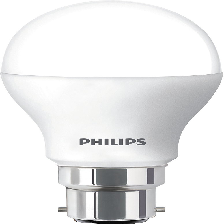

In [222]:
# View test image
image = load_img(f"Flipkart/Images/{test_df['image'][1]}", target_size = (224, 224))
image

In [223]:
image = img_to_array(image)
# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
#Predict the class
predictions = vgg_transfer.predict_classes(image, verbose=0)[0]

In [224]:
def int_2_category(label_number):
    category = df[df['category_lvl_1_int'] == label_number]['category_lvl_1'].unique()[0]
    return category

In [225]:
int_2_category(predictions)

' Laptop Accessories '

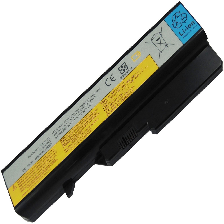

In [226]:
image = load_img(f"Flipkart/Images/{test_df['image'][2]}", target_size = (224, 224))
image

In [227]:
image = img_to_array(image)
# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
#Predict the class
predictions = vgg_transfer.predict_classes(image, verbose=0)[0]
#Convert label to category
int_2_category(predictions)

' Laptop Accessories '

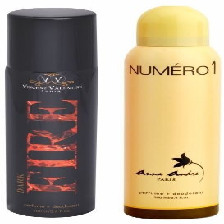

In [228]:
image = load_img(f"Flipkart/Images/{test_df['image'][3]}", target_size = (224, 224))
image

In [229]:
image = img_to_array(image)
# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
#Predict the class
predictions = vgg_transfer.predict_classes(image, verbose=0)[0]
#Convert label to category
int_2_category(predictions)

' Fragrances '

## Conclusions

Creating a classification algorithm based on the image and description is possible within a supervised framework (with product categories defined ahead of time). With a small dataset, we were already able to get encouraging results. The accuracy of the models should increase with more data.

The unsupervised algorithms, however, are not conclusive, especially the images. The identified clusters are either disproportionate or non-existent.